# Analisando os Sentimentos na Discografia da One Direction

A análise de sentimentos e inferência de emoções em músicas são técnicas que buscam identificar e interpretar as emoções expressas nas letras das canções. Esse tipo de análise utiliza algoritmos e modelos de aprendizado de máquina, como o Processamento de Linguagem Natural (PLN), para avaliar as palavras e frases contidas nas letras, classificando-as em polaridades como positivo, negativo ou neutro.

As letras de músicas são ricas em emoção e podem refletir uma ampla gama de sentimentos, como amor, tristeza, alegria, raiva e nostalgia, logo, a análise de sentimentos permite que artistas, produtores e ouvintes compreendam melhor como a música pode impactar as emoções humanas e a percepção do público. Com o avanço das tecnologias de Inteligência Artificial (IA) e PLN, a análise de sentimento em músicas está se tornando cada vez mais sofisticada, permitindo uma compreensão mais profunda e complexa das emoções humanas expressas através da arte musical.

## Importando Bibliotecas

In [1]:
# Importando bibliotecas de manipulação e análise de dados
import pandas as pd  # Usado para manipulação de tabelas e dataframes
import numpy as np   # Usado para operações matemáticas e arrays numéricos

# Biblioteca para processamento de imagens
from PIL import Image  # Usado para abrir, manipular e processar imagens

# Biblioteca para geração de nuvem de palavras (wordcloud)
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
# STOPWORDS: remove palavras irrelevantes
# ImageColorGenerator: usa as cores de uma imagem para colorir a wordcloud

# Biblioteca de NLP (Processamento de Linguagem Natural)
from nltk.tokenize import word_tokenize  # Quebra textos em palavras (tokens)

# Biblioteca para visualização de dados
import matplotlib.pyplot as plt  # Criação de gráficos e visualizações
from matplotlib.pyplot import figure  # Ajuste de tamanho de figuras
%matplotlib inline

# Baixando recursos da biblioteca NLTK
import nltk
nltk.download('punkt_tab')  # Tokenizador de pontuação/tabulação
nltk.download('vader_lexicon')  # Léxico para análise de sentimentos com VADER (análise de sentimentos)

# Biblioteca de visualização estatística
import seaborn as sns  # Estilização e gráficos estatísticos avançados

# Instalando bibliotecas com ! (comando de terminal usado no Jupyter)
!pip install shapely  # manipulação de formas geométricas
!pip install descartes       # Necessária para exibir formas geométricas com matplotlib
!pip install pyplutchik      # Biblioteca para visualização de emoções com o modelo de Plutchik

[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.
[nltk_data] Downloading package vader_lexicon to /root/nltk_data...


## Carregando arquivo com as músicas da Banda

O arquivo CSV foi gerado no notebook *Lyrics.ipynb*, contendo informações detalhadas sobre as músicas da famosa banda. O *dataset* inclui dados como título das faixas, álbum e ano de lançamento através da API *Genius*. A exportação para CSV permite uma fácil visualização, análise e compartilhamento dos dados.

In [3]:
# Leitura do Arquivo
df=pd.read_csv("OneDirectionLyrics.csv")

# Remove a coluna 'release_date'
df = df.drop(columns=['release_date'])

# Eliminando músicas não oficiais
df = df.drop(index=[53, 72, 76, 79])

# Reseta o índice, se necessário
df.reset_index(drop=True, inplace=True)

# Visualização do Dataframe
df

,title,lyrics,Album,release_year,Word Count
0,Night Changes,zayn liam goin tonight changes somethin mothe...,FOUR (The Ultimate Edition),2014.0,164
1,What Makes You Beautiful,liam insecure know turnin heads walk door nee...,Up All Night (The Souvenir Edition),2011.0,170
2,Story of My Life,harry liam written walls stories explain leav...,Midnight Memories (Japan Edition),2013.0,177
3,Perfect,louis might never knight shinin armour might ...,Made In The A.M. (Ultimate Fan Edition) [Japan...,2015.0,210
4,Drag Me Down,harry fire heart scared dark never seen look ...,Made In The A.M. (Ultimate Fan Edition) [Japan...,2015.0,197
...,...,...,...,...,...
81,Tell Me a Lie,liam zayn ever right matter hard tried well g...,Up All Night (The Souvenir Edition),2011.0,137
82,Loved You First,zayn liam girl driving house knockin door kis...,Take Me Home (Special Deluxe Edition),2012.0,165
83,Everything About You,liam harry know always back girl come running...,Up All Night (The Souvenir Edition),2011.0,173
84,Na Na Na,liam zayn liam harry love hate take edge brak...,Up All Night (The Souvenir Edition),2011.0,149


In [4]:
# Lista de palavras indesejadas presentes na discografia e não identificadas na etapa de tokenização
indesejadas = ['louis','liam','harry','zayn','niall','na','yeah','that','this','when','what']

# Remove as palavras indesejadas, e salva de volta como um texto longo
df['lyrics'] = df['lyrics'].apply(lambda x: ' '.join([palavra for palavra in x.split() if palavra not in (indesejadas)]))

# Une o dataframe em uma string longa/TextBlob
text = " ".join(twt for twt in df['lyrics'])
palavras = word_tokenize(text)

print("Existem {} palavras no dataset de letra.".format(len(palavras)))
print("Existem {} palavras únicas no dataset de letras.".format(len(set(palavras))))

Existem 11221 palavras no dataset de letra.
Existem 1314 palavras únicas no dataset de letras.


## Análise da Discografia
Primeiramente, será realizada uma análise exploratória do dataset como um todo, visando compreender sua estrutura, distribuição e características principais. Essa etapa é essencial para identificar padrões, possíveis inconsistências e *insights* iniciais sobre os dados. Essa análise preliminar ajudará a direcionar investigações mais específicas e a garantir a qualidade dos dados antes de aprofundar o estudo.

### Analisando o Dataset

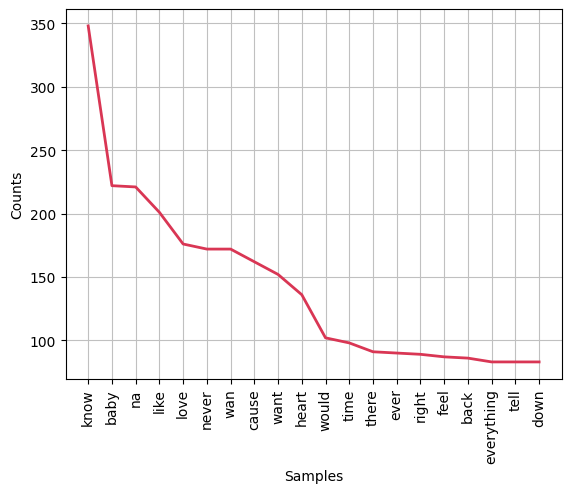

In [5]:
# Importa a classe FreqDist da biblioteca nltk, que é usada para calcular a frequência de distribuição de palavras
from nltk.probability import FreqDist

# Tokeniza o texto, dividindo-o em palavras individuais
words = word_tokenize(text)

# Cria uma distribuição de frequência das palavras no texto
fdist = FreqDist(words)

# Plota o gráfico de distribuição de frequência das 20 palavras mais comuns
# 'cumulative=False' indica que não será um gráfico acumulativo
# 'color' define a cor das barras no gráfico
fdist.plot(20, cumulative=False, color='#D93654')

# Exibe o gráfico gerado na tela
plt.show()

<div style="background-color: #e6f2ff; padding: 10px; border-radius: 5px;">
    <strong>Resultado do Gráfico</strong><br>
    Top 20 palavras mais frequentes na discografia da banda.
</div>

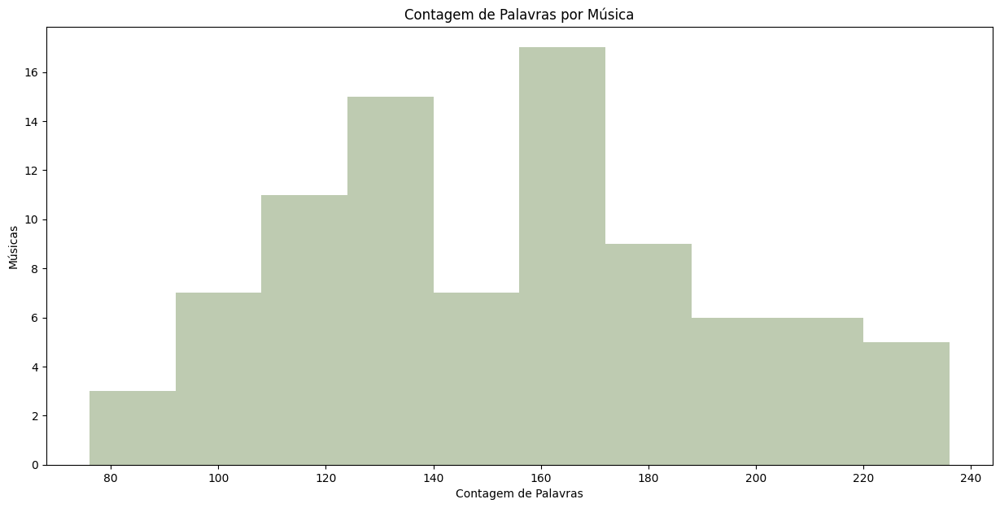

In [6]:
# Define o tamanho da figura do gráfico
plt.figure(figsize=(15, 7))

# Cria um histograma para a coluna 'Word Count' do DataFrame df
# '10' especifica o número de bins (intervalos) no histograma
(n, bins, patches) = plt.hist(df['Word Count'], bins=10, color='#BECBB1')

# Adiciona rótulo ao eixo x
plt.xlabel('Contagem de Palavras')

# Adiciona rótulo ao eixo y
plt.ylabel('Músicas')

# Adiciona um título ao gráfico
plt.title('Contagem de Palavras por Música')

# Exibe o gráfico
plt.show()

<div style="background-color: #e6f2ff; padding: 10px; border-radius: 5px;">
    <strong>Análise do Gráfico</strong><br>
    O resultado é um histograma que representa a distribuição da contagem de palavras das músicas. Cada barra no histograma mostra quantas músicas caem dentro de cada intervalo de contagem de palavras. Isso permite visualizar rapidamente como as músicas se distribuem em relação à sua contagem de palavras, identificando padrões, como se a maioria das músicas tende a ser mais curtas ou mais longas.
</div>

### Análise de Sentimento da Discografia

A análise de sentimentos é uma técnica da área de Processamento de Linguagem Natural (PLN) que tem como objetivo identificar e classificar emoções expressas em textos, como opiniões, comentários, avaliações e postagens em redes sociais. Um dos principais aspectos dessa análise é a **polaridade**, que indica a direção do sentimento expresso: **positivo**, **negativo** ou **neutro**.

**Polaridade Positiva** refere-se a textos que expressam sentimentos favoráveis, elogios ou apreciações. Exemplos incluem palavras como "ótimo", "maravilhoso", "excelente" e "gostei". Comentários positivos geralmente indicam satisfação com um produto, serviço ou experiência.

**Polaridade Negativa**, por sua vez, é associada a emoções negativas, críticas ou insatisfações. Termos como "horrível", "péssimo", "não gostei" e "decepcionante" são indicadores comuns. Esse tipo de polaridade ajuda a identificar pontos de melhoria a partir de feedbacks negativos dos usuários.

Já a **Polaridade Neutra** está presente em textos que não expressam uma opinião clara ou não possuem carga emocional significativa. Comentários como "o produto chegou ontem", "estava chovendo" ou "fiz a compra hoje" são exemplos de frases informativas, sem julgamento emocional.

Em aplicações práticas, a identificação correta da polaridade é essencial para empresas e pesquisadores compreenderem melhor o comportamento e a percepção dos usuários. Isso pode influenciar estratégias de marketing, aprimoramento de produtos e até mesmo monitoramento de reputação online.

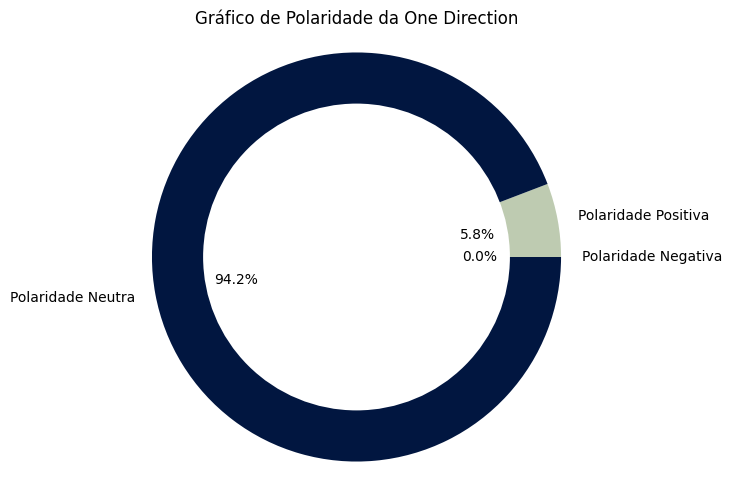

In [8]:
# Importa a classe SentimentIntensityAnalyzer do módulo nltk.sentiment
# Essa classe permite calcular a intensidade do sentimento de um texto
from nltk.sentiment import SentimentIntensityAnalyzer

# Cria uma instância do SentimentIntensityAnalyzer para analisar o sentimento
analyzer = SentimentIntensityAnalyzer()

# Analisa o sentimento de todas as letras juntas
# O método polarity_scores(text) retorna um dicionário com as pontuações de sentimento:
# 'neg' para negativo, 'neu' para neutro, 'pos' para positivo e 'compound' para uma pontuação geral
# Une o dataframe em uma string longa/TextBlob
text = " ".join(twt for twt in df['lyrics'])
analyzer.polarity_scores(text)

# Análise de sentimento para cada música (com sentimento neutro incluído)

# Define uma função para obter o sentimento de cada letra individualmente
def fetch_sentiment(x):
    polarity = analyzer.polarity_scores(x)
    # Decide o sentimento com base na pontuação dominante
    if polarity['neu'] > polarity['pos'] and polarity['neu'] > polarity['neg']:
        return 'neu'
    elif polarity['pos'] >= polarity['neg']:
        return 'pos'
    else:
        return 'neg'

# Aplica a função à coluna de letras
sentiment = df['lyrics'].apply(fetch_sentiment).value_counts()

# Garante que todas as categorias estejam presentes (mesmo que com 0)
sentiment = sentiment.reindex(['pos', 'neu', 'neg'], fill_value=0)

# Labels e cores
labels = ['Polaridade Positiva', 'Polaridade Neutra', 'Polaridade Negativa']
colors = ['#BECBB1', '#011640', '#D93654']

# Gráfico de pizza
plt.pie(sentiment, labels=labels, autopct='%1.1f%%', colors=colors)

# Círculo central (estilo donut)
cc = plt.Circle((0,0),0.75,fc='#FFFFFF')
fig = plt.gcf()
fig.gca().add_artist(cc)

# Exibição do gráfico
plt.tight_layout()
plt.title('Gráfico de Polaridade da One Direction')
plt.axis('equal')
plt.show()

<div style="background-color: #e6f2ff; padding: 10px; border-radius: 5px;">
    <strong>Análise do Gráfico de Polaridade</strong><br>
    A discografia apresenta 5.8% de polaridade positiva.
</div>

### Nuvem de Palavras
A **nuvem de palavras** (ou *word cloud*, em inglês) é uma técnica visual utilizada para representar a frequência ou relevância de palavras em um determinado conjunto de dados textuais. Nesse tipo de visualização, quanto mais uma palavra aparece em um texto ou conjunto de textos, maior será o seu destaque na nuvem — normalmente por meio de um tamanho de fonte mais elevado.

Essa ferramenta é muito usada em análises exploratórias de dados textuais, especialmente em áreas como análise de sentimentos, mineração de texto, marketing digital, pesquisa acadêmica, entre outras. Ela permite uma compreensão rápida dos termos mais recorrentes em conteúdos como comentários de usuários, postagens em redes sociais, discursos políticos, letras de músicas ou avaliações de produtos.

A construção de uma nuvem de palavras geralmente envolve etapas de pré-processamento do texto, como:
- **Remoção de stopwords** (palavras comuns como “de”, “o”, “e”, que não agregam valor semântico relevante);
- **Lematização ou stemming** (redução de palavras à sua forma base);
- **Tratamento de pontuação e acentuação**.

Embora seja uma técnica simples, a nuvem de palavras oferece uma forma intuitiva e visual de identificar temas recorrentes, tendências e padrões de linguagem.

Index(['title', 'lyrics', 'Album', 'release_year', 'Word Count'], dtype='object')


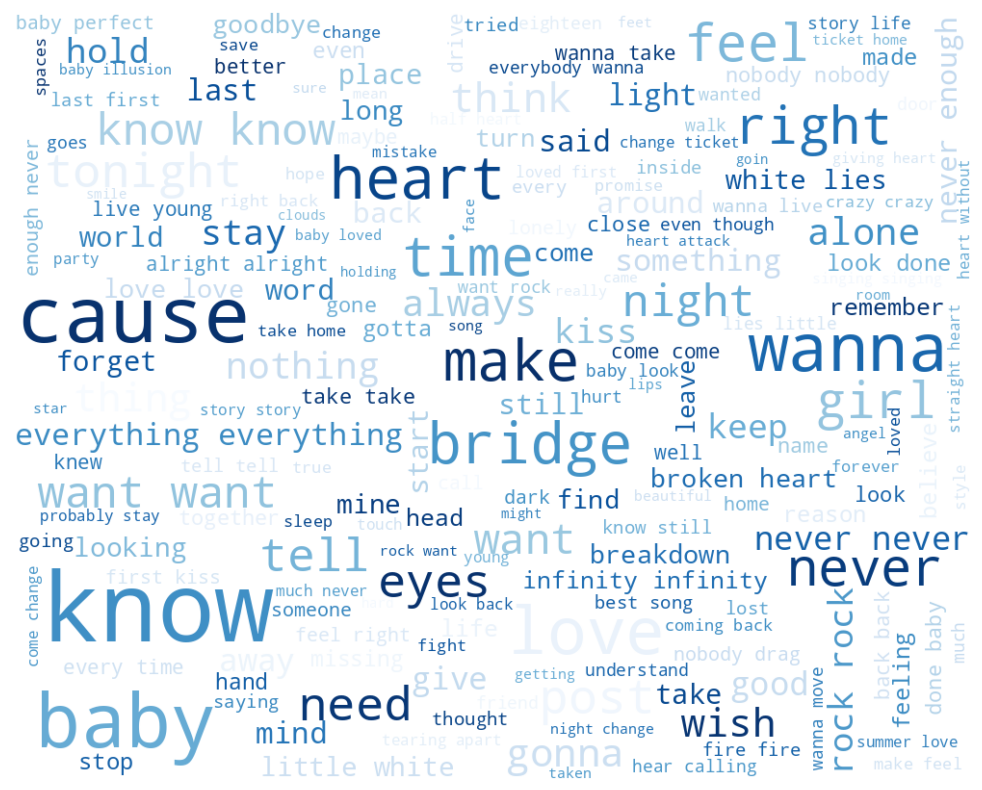

In [9]:
# Exibir os nomes das colunas do DataFrame
print(df.columns)

# Verifica se a coluna 'Lyrics' existe
if 'lyrics' in df.columns:
    # Verifica se não há valores nulos na coluna 'Lyrics'
    df['lyrics'] = df['lyrics'].fillna('')  # Substitui valores nulos por string vazia
    text = " ".join(twt for twt in df['lyrics'])

    # Gerando a nuvem de palavras com um tema claro
    wc = WordCloud(
        width=1000,
        height=800,
        random_state=21,
        max_font_size=100,
        relative_scaling=0.5,
        colormap="Blues",  # Alterado para um esquema de cores de fundo branco
        background_color="white"  # Define fundo branco explicitamente
    ).generate(text)

    # Exibindo a nuvem de palavras
    plt.figure(figsize=(14, 10))
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.show()
else:
    print("A coluna 'Lyrics' não foi encontrada no DataFrame.")

## Análise NRC para Inferência de Emoções
O arquivo NRC (National Research Council) é um recurso amplamente utilizado na análise de sentimentos, especialmente no contexto de processamento de linguagem natural (PLN) e mineração de texto. O NRC desenvolveu um léxico de sentimentos que categoriza palavras em diferentes emoções, permitindo que pesquisadores e desenvolvedores analisem letras de músicas, resenhas e outros textos em relação a sentimentos específicos.

### Estrutura do Arquivo NRC
O léxico do NRC é estruturado em várias colunas, onde as palavras são associadas a diferentes emoções e sentimentos, incluindo: Alegria, Tristeza, Medo,
Raiva, Surpresa, Desprezo, Confiança e Antipatia. Cada palavra no léxico é marcada como presente ou ausente em relação a essas emoções, permitindo que os usuários quantifiquem e analisem a presença de sentimentos em um texto.

### Aplicações na Análise de Músicas
Identificação de Emoções: Ao aplicar o léxico NRC às letras de músicas, é possível identificar quais emoções são mais proeminentes em uma canção. Por exemplo, uma letra pode ser classificada como predominantemente alegre, triste ou reflexiva.

**Comparação Entre Músicas:** O NRC permite a comparação de diferentes músicas ou álbuns, facilitando a análise de como os sentimentos evoluem ao longo do tempo ou entre diferentes artistas. Essa comparação pode revelar como as temáticas abordadas nas letras mudam conforme a carreira de um artista avança.

**Análise de Tendências:** Ao analisar um conjunto de músicas (por exemplo, todas as músicas lançadas em um determinado ano), os pesquisadores podem identificar tendências emocionais na música popular. Isso pode fornecer insights sobre a cultura e os sentimentos coletivos de uma sociedade em um período específico.

**Desenvolvimento de Recomendação:** O entendimento dos sentimentos nas músicas pode ajudar a criar sistemas de recomendação mais personalizados, sugerindo músicas com base no estado emocional do ouvinte.

O uso do arquivo NRC na análise de letras de músicas é uma ferramenta poderosa para compreender as emoções expressas na música. Com a capacidade de quantificar sentimentos, pesquisadores e desenvolvedores podem explorar a rica tapeçaria emocional das letras e como elas ressoam com os ouvintes. Essa análise não apenas enriquece nossa compreensão da música como arte, mas também nos oferece uma janela para as emoções humanas e a cultura contemporânea.

In [10]:
#Biblioteca para usar o NRC alinhado ao NLTK
from collections import defaultdict

# Carregar o lexicon NRC
nrc = pd.read_csv("NRC.tsv", sep='\t', names=['word', 'sentiment', 'association'])
nrc = nrc[nrc['association'] == 1]

# Definir emoções (exclui 'positive' e 'negative')
emotion_sentiments = {
    'anger', 'anticipation', 'disgust', 'fear',
    'joy', 'sadness', 'surprise', 'trust'
}

# Dicionário: palavra -> lista de emoções
nrc_dict = defaultdict(list)
for _, row in nrc.iterrows():
    if row['sentiment'] in emotion_sentiments:
        nrc_dict[row['word']].append(row['sentiment'])

# Emoções positivas e negativas para score
positive = {'joy', 'trust', 'anticipation', 'surprise'}
negative = {'anger', 'fear', 'disgust', 'sadness'}

# Função de análise
def analyze_text(text):
    tokens = word_tokenize(text.lower())
    sentiments_count = defaultdict(int)

    for token in tokens:
        for sentiment in nrc_dict.get(token, []):
            sentiments_count[sentiment] += 1

    score = sum(sentiments_count[s] for s in positive) - \
            sum(sentiments_count[s] for s in negative)

    dominant_emotion = max(sentiments_count, key=sentiments_count.get) if sentiments_count else 'neutral'
    filter_label = 'intenso' if abs(score) > 2 else 'neutro'

    return pd.Series([score, dominant_emotion, filter_label], index=['score', 'sentiment', 'filter'])

# Aplicar no DataFrame
df[['score', 'sentiment', 'filter']] = df['lyrics'].apply(analyze_text)

# Normalizar a coluna 'score' entre -1 e 1
min_score = df['score'].min()
max_score = df['score'].max()

# Evitar divisão por zero se max == min
if min_score != max_score:
    df['score'] = 2 * ((df['score'] - min_score) / (max_score - min_score)) - 1
else:
    df['score'] = 0  # ou qualquer valor neutro

# Fazendo cópias para análises profundas
df_original = df.copy()
df_original_2 = df_original.copy()
df_original_3 = df_original.copy()
df_original_4 = df_original.copy()
df_original_5 = df_original.copy()
df_original_6 = df_original.copy()

# Exibir resultado
df

,title,lyrics,Album,release_year,Word Count,score,sentiment,filter
0,Night Changes,goin tonight changes somethin mother like kind...,FOUR (The Ultimate Edition),2014.0,164,-0.314286,fear,intenso
1,What Makes You Beautiful,insecure know turnin heads walk door need make...,Up All Night (The Souvenir Edition),2011.0,170,0.214286,joy,intenso
2,Story of My Life,written walls stories explain leave heart open...,Midnight Memories (Japan Edition),2013.0,177,-0.057143,sadness,intenso
3,Perfect,might never knight shinin armour might never t...,Made In The A.M. (Ultimate Fan Edition) [Japan...,2015.0,210,1.000000,joy,intenso
4,Drag Me Down,fire heart scared dark never seen look easy ri...,Made In The A.M. (Ultimate Fan Edition) [Japan...,2015.0,197,-0.157143,joy,intenso
...,...,...,...,...,...,...,...,...
81,Tell Me a Lie,ever right matter hard tried well good fight w...,Up All Night (The Souvenir Edition),2011.0,137,-0.057143,joy,intenso
82,Loved You First,girl driving house knockin door kissing mouth ...,Take Me Home (Special Deluxe Edition),2012.0,165,0.057143,joy,intenso
83,Everything About You,know always back girl come running running run...,Up All Night (The Souvenir Edition),2011.0,173,0.242857,joy,intenso
84,Na Na Na,love hate take edge brakes crawling back beggi...,Up All Night (The Souvenir Edition),2011.0,149,-0.385714,sadness,intenso


<div style="background-color: #e6f2ff; padding: 10px; border-radius: 5px;">
    <strong>Normalização de Dados</strong><br>
    Para evitar validação cruzada de dados e separação de base de teste e aplicação, foi utilizado uma função de normalização de dados.
</div>

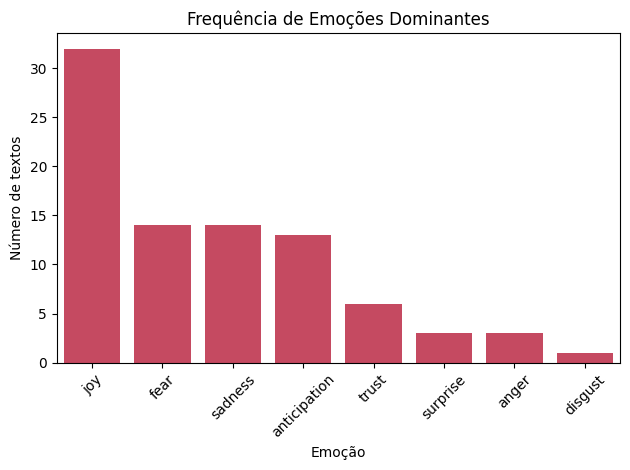

In [11]:
 # Cria um gráfico de barras com contagem
sns.countplot(
    x='sentiment',
    data=df,
    order=df['sentiment'].value_counts().index,  # Ordena as barras pela frequência de cada emoção
    color='#D93654'
)

# Construção do gráfico
plt.title('Frequência de Emoções Dominantes')
plt.ylabel('Número de textos')
plt.xlabel('Emoção')
plt.xticks(rotation=45)
plt.tight_layout()                             # Ajusta o layout para evitar que os textos fiquem cortados
plt.show()

<div style="background-color: #e6f2ff; padding: 10px; border-radius: 5px;">
    <strong>Análise do Gráfico</strong><br>
    A discografia possui alto teor de alegria.
</div>

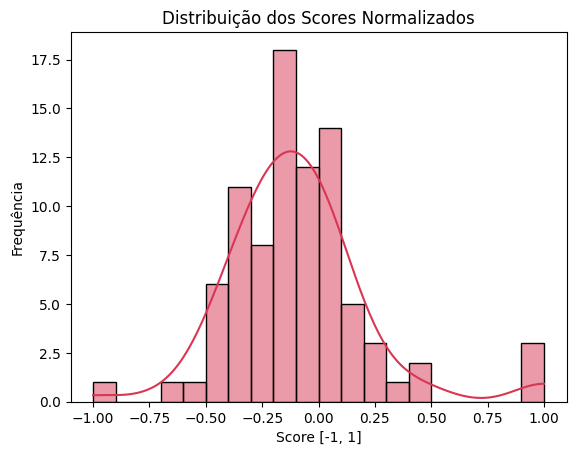

In [12]:
sns.histplot(df['score'], bins=20, kde=True, color='#D93654')
plt.title('Distribuição dos Scores Normalizados')
plt.xlabel('Score [-1, 1]')
plt.ylabel('Frequência')
plt.show()

<div style="background-color: #e6f2ff; padding: 10px; border-radius: 5px;">
    <strong>Análise do Gráfico</strong><br>
    Os scores estão bem concentrados na polaridade neutra.
</div>

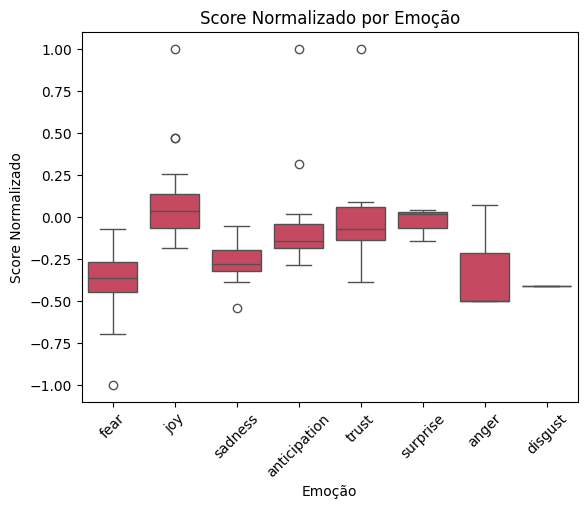

In [13]:
sns.boxplot(x='sentiment', y='score', data=df, color='#D93654')
plt.title('Score Normalizado por Emoção')
plt.xlabel('Emoção')
plt.ylabel('Score Normalizado')
plt.xticks(rotation=45)
plt.show()

Esse gráfico boxplot compara os scores normalizados de sentimento para cada emoção.

- O **centro da caixa** é a **mediana** (valor do meio).
- As **caixas** mostram o intervalo interquartílico (de 25% a 75% dos dados).
- Os **"bigodes"** (linhas fora das caixas) mostram a dispersão.
- Os **pontos fora do padrão** são **outliers**.



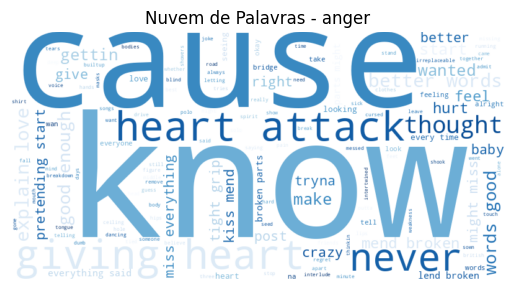

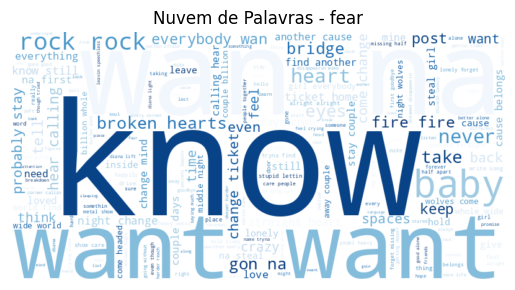

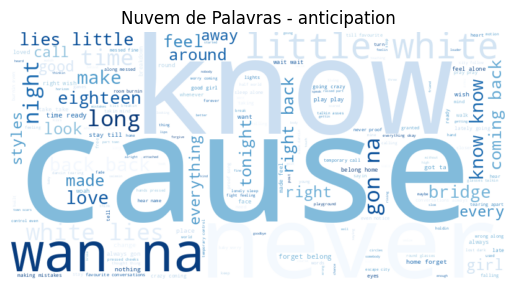

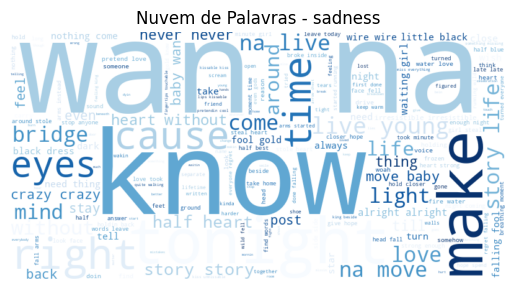

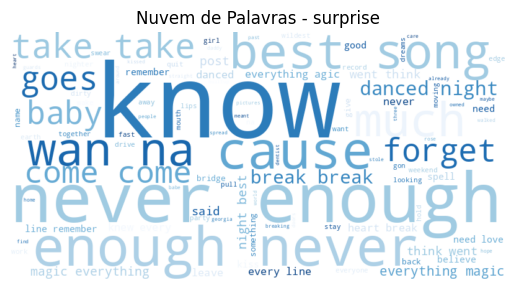

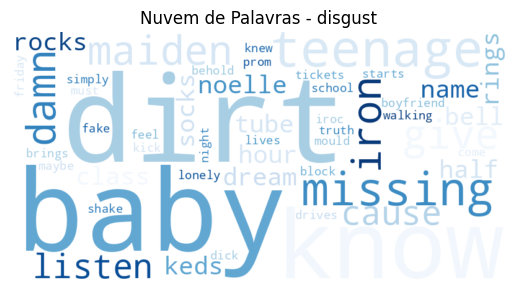

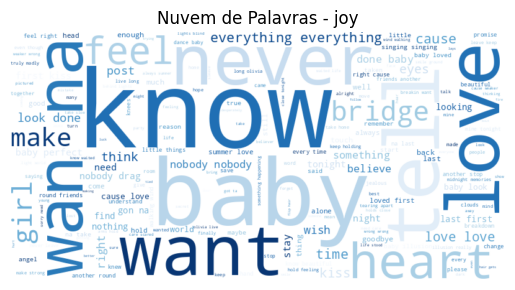

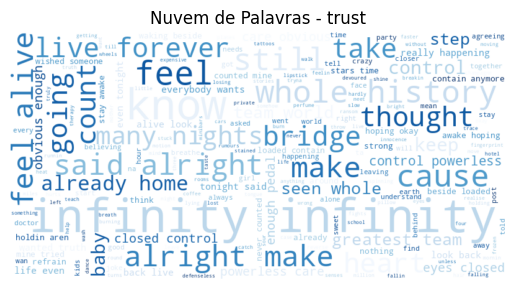

In [14]:
# Gerar a nuvem de palavras para cada emoção
for emotion in emotion_sentiments:
    words = []
    for text in df[df['sentiment'] == emotion]['lyrics']:
        words.extend(word_tokenize(text.lower()))

    # Verificar se há palavras antes de gerar a nuvem
    if not words:
        print(f"Nenhuma palavra encontrada para a emoção: {emotion}")
        continue

    # Gerar a nuvem de palavras com fundo branco e tons de azul
    wordcloud = WordCloud(
        width=800,
        height=400,
        background_color='white',  # Fundo branco
        colormap='Blues'  # Paleta de tons de azul
    ).generate(' '.join(words))

    plt.figure()
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Nuvem de Palavras - {emotion}')
    plt.show()

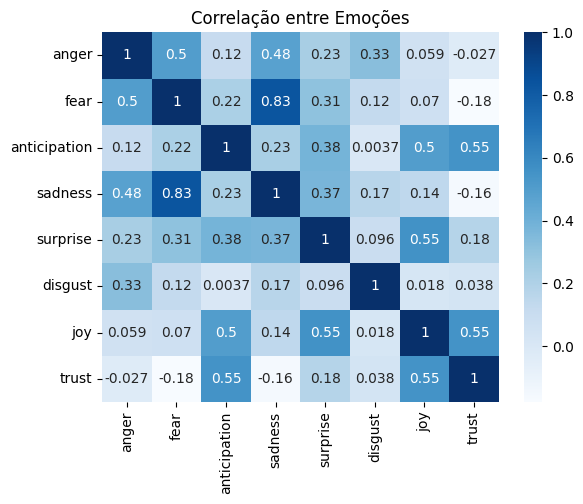

In [15]:
# Contar emoções por texto
emotion_columns = list(emotion_sentiments)
emotion_counts = []

for text in df['lyrics']:
    tokens = word_tokenize(text.lower())
    counts = {emotion: 0 for emotion in emotion_columns}
    for token in tokens:
        for emotion in nrc_dict.get(token, []):
            counts[emotion] += 1
    emotion_counts.append(counts)

emotion_df = pd.DataFrame(emotion_counts)

# Gerar o heatmap com tons de azul
sns.heatmap(emotion_df.corr(), annot=True, cmap="Blues")
plt.title("Correlação entre Emoções")
plt.show()

## Análise do álbum Up All Night

*Up All Night* é o álbum de estreia da *boyband anglo-irlandesa, lançado em 18 de novembro de 2011 na Irlanda e no Reino Unido, prosseguindo com uma distribuição global no ano seguinte. Depois de terminar em terceiro lugar na sétima temporada do *The X Factor* em dezembro de 2010, a banda assinou com a *Syco Music* e começou a gravar o disco na Suécia, no Reino Unido e nos Estados Unidos, trabalhando com diversos compositores e produtores. O projeto deriva principalmente do estilo musical *pop* e também direciona para o *pop rock*, *dance-pop*, *teen pop* e *power pop*. Seu conteúdo lírico é constituído em maioria por frases sobre ser jovem, relacionamentos, mágoa e empoderamento. Em apoio ao produto, os integrantes apresentaram as canções em programas televisivos, prêmios musicais e durante a *Up All Night Tour*.

O álbum recebeu análises em sua maioria positivas dos críticos musicais contemporâneos, muitos dos quais apreciaram a combinação de canções melódicas e cativantes em um material *pop*, que, embora astutamente produzido, evitou o cinismo comercial, e a postura *adult contemporary* de alguns de seus antepassados dos anos 80 e 90. Um sucesso internacional, o disco conseguiu o topo das tabelas musicais em dezesseis países, e, até dezembro de 2012, já tinha vendido mais de 2.5 milhões de cópias no mundo todo. Conquistou a segunda posição na *UK Albums Chart* e, em última análise, se tornou o produto de estreia mais rapidamente vendido no Reino Unido em 2011. Foi direto para a primeira colocação da *Billboard 200*, conseguindo um lucro total de 176 mil exemplares em sua primeira semana nas lojas, tornando a One Direction o primeiro grupo britânico na história das paradas estadunidenses a conquistar este feito no primeiro lançamento. Como resultado, os integrantes foram introduzidos ao *Guinness World Records*. Consoante a Federação Internacional da Indústria Fonográfica, o material foi o terceiro mais vendido em 2012 em todo o globo com mais de 4.5 milhões de cópias.

Quatro *singles* foram lançados a partir do projeto, "What Makes You Beautiful", "Gotta Be You", "One Thing" e "More than This". Os três primeiros conseguiram registrar entrada nas dez primeiras colocações da *UK Singles Chart*.

Mais informações em: https://pt.wikipedia.org/wiki/Up_All_Night_(%C3%A1lbum)

In [16]:
# Filtrando o DataFrame para excluir músicas do seu álbum
df_un = df[df['Album'].isin(['Up All Night (The Souvenir Edition)'])]

# Exibindo o DataFrame filtrado
df_un

,title,lyrics,Album,release_year,Word Count,score,sentiment,filter
1,What Makes You Beautiful,insecure know turnin heads walk door need make...,Up All Night (The Souvenir Edition),2011.0,170,0.214286,joy,intenso
25,One Thing,tried playin cool lookin ever brave cause make...,Up All Night (The Souvenir Edition),2011.0,121,-0.285714,sadness,intenso
31,More Than This,broken hear blinded cause everything dancing a...,Up All Night (The Souvenir Edition),2011.0,186,0.014286,joy,intenso
49,Moments,shut door turn light wanna wanna feel love wan...,Up All Night (The Souvenir Edition),2011.0,171,-0.328571,sadness,intenso
60,Gotta Be You,girl eyes disappointed cause foolish anointed ...,Up All Night (The Souvenir Edition),2011.0,105,-0.200000,anticipation,neutro
64,I Want,give give blow kiss take back look inside brai...,Up All Night (The Souvenir Edition),2011.0,161,-0.428571,fear,intenso
66,Stole My Heart,waiting girl like light shines getting shoulde...,Up All Night (The Souvenir Edition),2011.0,178,-0.314286,sadness,intenso
68,Taken,suddenly want somebody else tell love slept do...,Up All Night (The Souvenir Edition),2011.0,115,-0.185714,joy,neutro
70,I Wish,takes hand little watch eyes riddles look like...,Up All Night (The Souvenir Edition),2011.0,123,-0.142857,anticipation,intenso
76,Same Mistakes,circles going circles dizzy makes know takes b...,Up All Night (The Souvenir Edition),2011.0,171,-0.057143,anticipation,intenso


In [17]:
# Une o dataframe em uma string longa/TextBlob
text = " ".join(twt for twt in df_un['lyrics'])
palavras = word_tokenize(text)

print("Existem {} palavras no dataset de letra.".format(len(palavras)))
print("Existem {} palavras únicas no dataset de letras.".format(len(set(palavras))))

Existem 1598 palavras no dataset de letra.
Existem 403 palavras únicas no dataset de letras.


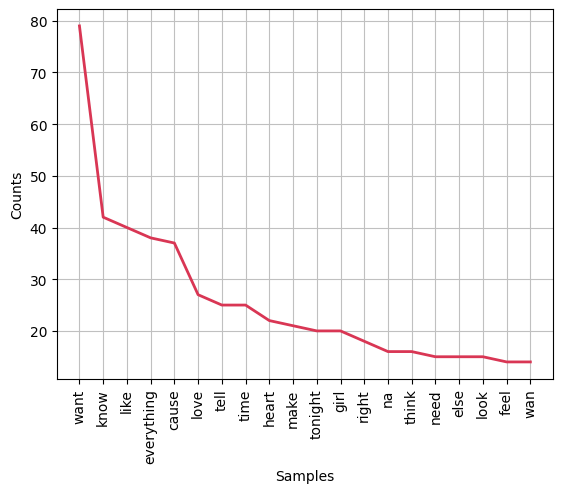

In [18]:
# Importa a classe FreqDist da biblioteca nltk, que é usada para calcular a frequência de distribuição de palavras
from nltk.probability import FreqDist

# Tokeniza o texto, dividindo-o em palavras individuais
words = word_tokenize(text)

# Cria uma distribuição de frequência das palavras no texto
fdist = FreqDist(words)

# Plota o gráfico de distribuição de frequência das 20 palavras mais comuns
# 'cumulative=False' indica que não será um gráfico acumulativo
# 'color' define a cor das barras no gráfico
fdist.plot(20, cumulative=False, color='#D93654')

# Exibe o gráfico gerado na tela
plt.show()

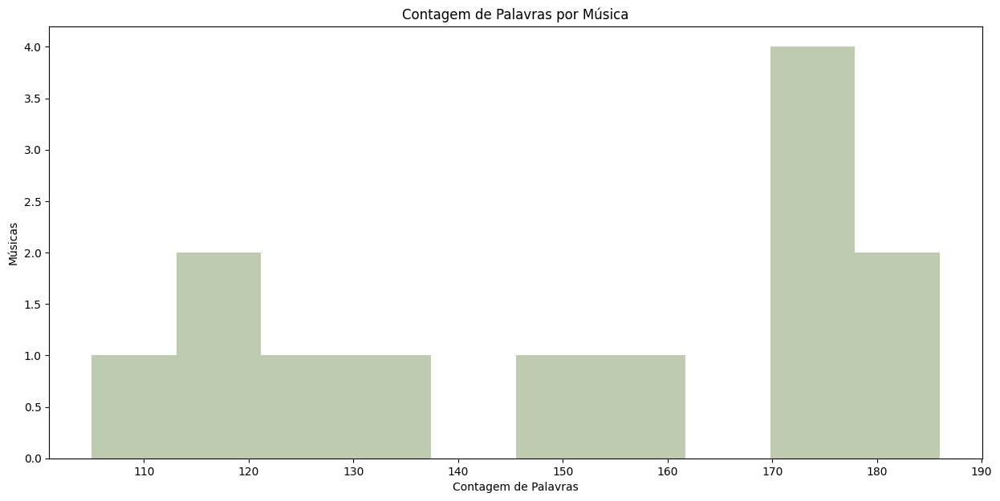

In [19]:
# Define o tamanho da figura do gráfico
plt.figure(figsize=(15, 7))

# Cria um histograma para a coluna 'Word Count' do DataFrame df_reflection
# '10' especifica o número de bins (intervalos) no histograma
(n, bins, patches) = plt.hist(df_un['Word Count'], bins=10, color='#BECBB1')

# Adiciona rótulo ao eixo x
plt.xlabel('Contagem de Palavras')

# Adiciona rótulo ao eixo y
plt.ylabel('Músicas')

# Adiciona um título ao gráfico
plt.title('Contagem de Palavras por Música')

# Exibe o gráfico
plt.show()

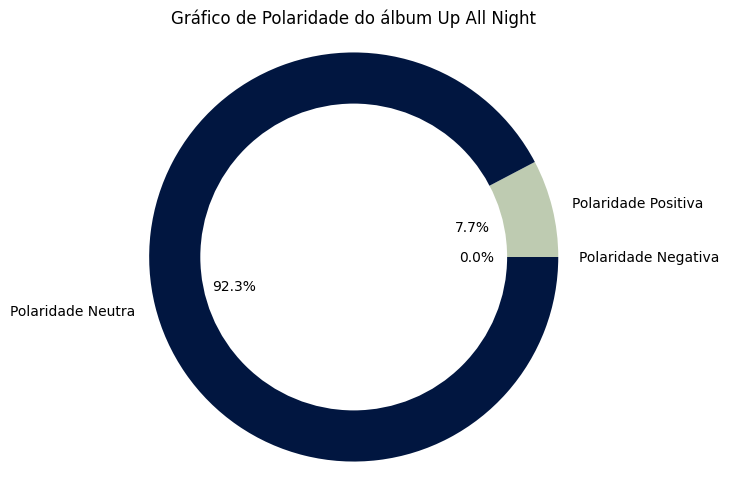

In [21]:
# Importa a classe SentimentIntensityAnalyzer do módulo nltk.sentiment
# Essa classe permite calcular a intensidade do sentimento de um texto
from nltk.sentiment import SentimentIntensityAnalyzer

# Cria uma instância do SentimentIntensityAnalyzer para analisar o sentimento
analyzer = SentimentIntensityAnalyzer()

# Analisa o sentimento de todas as letras juntas
# O método polarity_scores(text) retorna um dicionário com as pontuações de sentimento:
# 'neg' para negativo, 'neu' para neutro, 'pos' para positivo e 'compound' para uma pontuação geral
# Une o dataframe em uma string longa/TextBlob
text = " ".join(twt for twt in df_un['lyrics'])
analyzer.polarity_scores(text)

# Análise de sentimento para cada música (com sentimento neutro incluído)

# Define uma função para obter o sentimento de cada letra individualmente
def fetch_sentiment(x):
    polarity = analyzer.polarity_scores(x)
    # Decide o sentimento com base na pontuação dominante
    if polarity['neu'] > polarity['pos'] and polarity['neu'] > polarity['neg']:
        return 'neu'
    elif polarity['pos'] >= polarity['neg']:
        return 'pos'
    else:
        return 'neg'

# Aplica a função à coluna de letras
sentiment = df_un['lyrics'].apply(fetch_sentiment).value_counts()

# Garante que todas as categorias estejam presentes (mesmo que com 0)
sentiment = sentiment.reindex(['pos', 'neu', 'neg'], fill_value=0)

# Labels e cores
labels = ['Polaridade Positiva', 'Polaridade Neutra', 'Polaridade Negativa']
colors = ['#BECBB1', '#011640', '#D93654']

# Gráfico de pizza
plt.pie(sentiment, labels=labels, autopct='%1.1f%%', colors=colors)

# Círculo central (estilo donut)
cc = plt.Circle((0,0),0.75,fc='#FFFFFF')
fig = plt.gcf()
fig.gca().add_artist(cc)

# Exibição do gráfico
plt.tight_layout()
plt.title('Gráfico de Polaridade do álbum Up All Night')
plt.axis('equal')
plt.show()

<div style="background-color: #e6f2ff; padding: 10px; border-radius: 5px;">
    <strong>Análise do Gráfico de Polaridade</strong><br>
    A discografia apresenta 7.7% de polaridade positiva.
</div>

Index(['title', 'lyrics', 'Album', 'release_year', 'Word Count', 'score',
       'sentiment', 'filter'],
      dtype='object')


<ipython-input-22-7b98a9b56ab3>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_un['lyrics'] = df_un['lyrics'].fillna('')  # Substitui valores nulos por string vazia


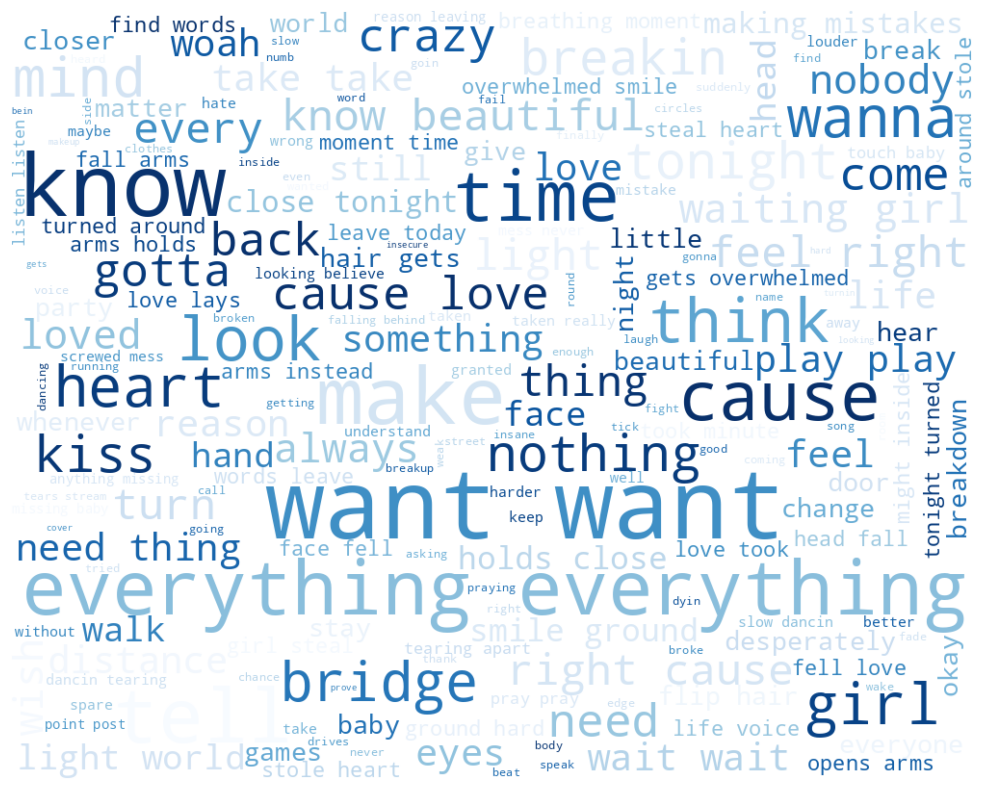

In [22]:
# Exibir os nomes das colunas do DataFrame
print(df_un.columns)

# Verifica se a coluna 'Lyrics' existe
if 'lyrics' in df_un.columns:
    # Verifica se não há valores nulos na coluna 'Lyrics'
    df_un['lyrics'] = df_un['lyrics'].fillna('')  # Substitui valores nulos por string vazia
    text = " ".join(twt for twt in df_un['lyrics'])

    # Gerando a nuvem de palavras com um tema claro
    wc = WordCloud(
        width=1000,
        height=800,
        random_state=21,
        max_font_size=100,
        relative_scaling=0.5,
        colormap="Blues",  # Alterado para um esquema de cores de fundo branco
        background_color="white"  # Define fundo branco explicitamente
    ).generate(text)

    # Exibindo a nuvem de palavras
    plt.figure(figsize=(14, 10))
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.show()
else:
    print("A coluna 'Lyrics' não foi encontrada no DataFrame.")

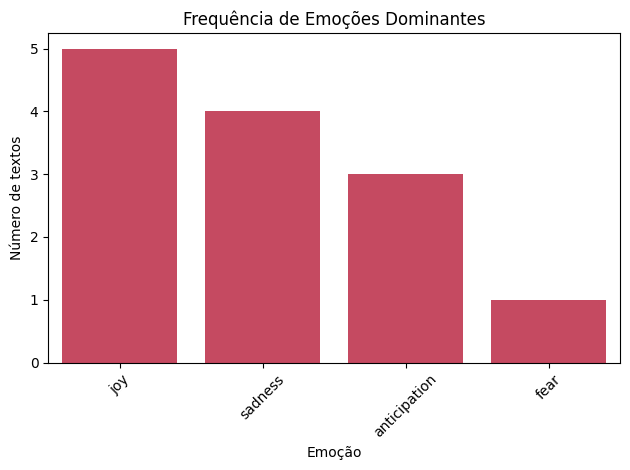

In [23]:
# Construção da barra por contagem
sns.countplot(
    x='sentiment',
    data=df_un,
    order=df_un['sentiment'].value_counts().index,
    color='#D93654'  # cor personalizada
)

# Gerando o gráfico
plt.title('Frequência de Emoções Dominantes')
plt.ylabel('Número de textos')
plt.xlabel('Emoção')
plt.xticks(rotation=45)
plt.tight_layout() #Ajuste automático
plt.show()

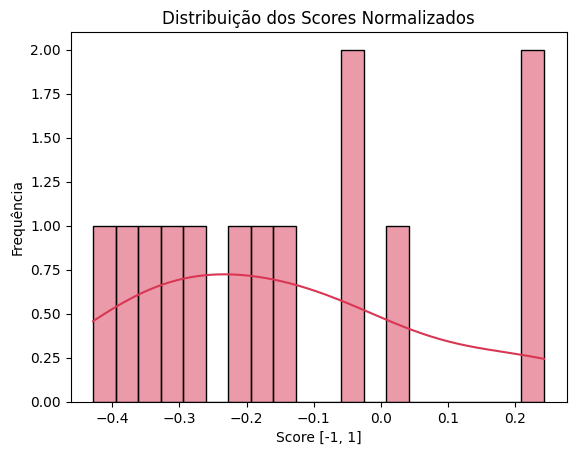

In [24]:
## Construção do Histograma
sns.histplot(df_un['score'], bins=20, kde=True, color='#D93654')
plt.title('Distribuição dos Scores Normalizados')
plt.xlabel('Score [-1, 1]')
plt.ylabel('Frequência')
plt.show()

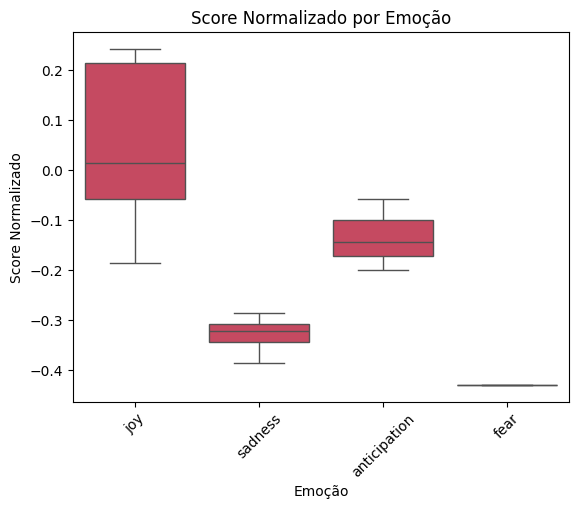

In [25]:
sns.boxplot(x='sentiment', y='score', data=df_un, color='#D93654')
plt.title('Score Normalizado por Emoção')
plt.xlabel('Emoção')
plt.ylabel('Score Normalizado')
plt.xticks(rotation=45)
plt.show()

Nenhuma letra encontrada para a emoção 'anger'.


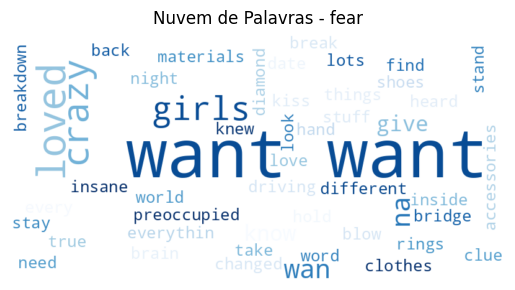

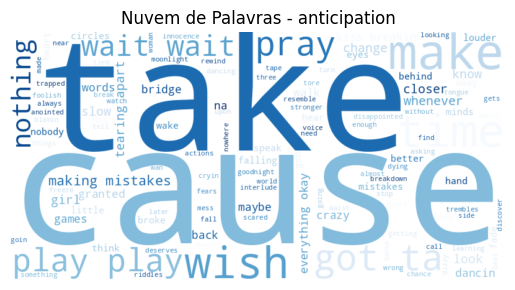

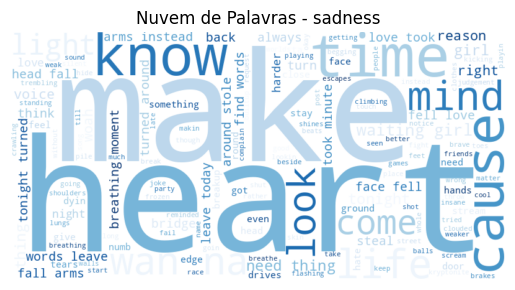

Nenhuma letra encontrada para a emoção 'surprise'.
Nenhuma letra encontrada para a emoção 'disgust'.


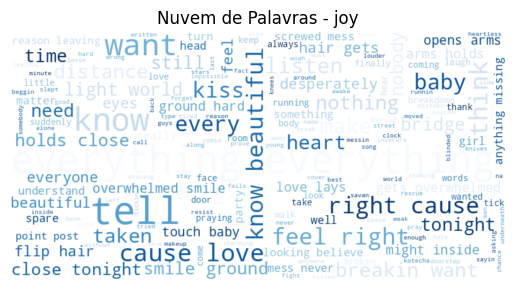

Nenhuma letra encontrada para a emoção 'trust'.


In [26]:
# Gerar a nuvem de palavras para cada emoção
for emotion in emotion_sentiments:
    words = []

    # Verificar se há letras associadas à emoção
    emotion_lyrics = df_un[df_un['sentiment'] == emotion]['lyrics']

    # Verifica se a emoção tem textos associados
    if not emotion_lyrics.empty:
        for text in emotion_lyrics:
            words.extend(word_tokenize(text.lower()))

        # Se houver palavras associadas à emoção
        if words:
            # Gerar a nuvem de palavras com fundo branco e tons de azul
            wordcloud = WordCloud(
                width=800,
                height=400,
                background_color='white',  # Fundo branco
                colormap='Blues'  # Paleta de tons de azul
            ).generate(' '.join(words))

            # Mostrar a nuvem de palavras
            plt.figure()
            plt.imshow(wordcloud, interpolation='bilinear')
            plt.axis('off')
            plt.title(f'Nuvem de Palavras - {emotion}')
            plt.show()
        else:
            print(f"Nenhuma palavra encontrada para a emoção '{emotion}'.")
    else:
        print(f"Nenhuma letra encontrada para a emoção '{emotion}'.")

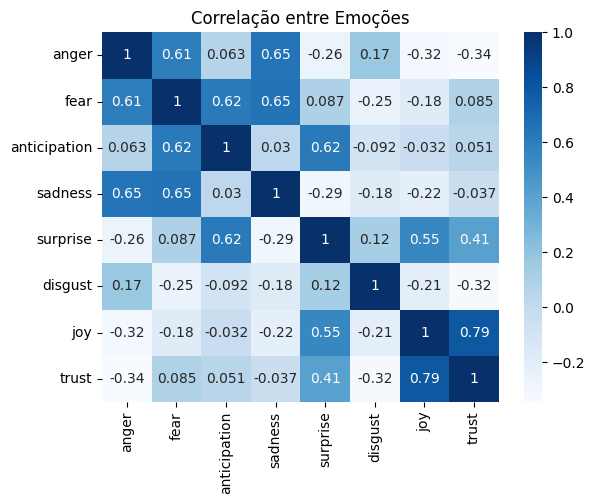

In [27]:
# Contar emoções por texto
emotion_columns = list(emotion_sentiments)
emotion_counts = []

for text in df_un['lyrics']:
    tokens = word_tokenize(text.lower())
    counts = {emotion: 0 for emotion in emotion_columns}
    for token in tokens:
        for emotion in nrc_dict.get(token, []):
            counts[emotion] += 1
    emotion_counts.append(counts)

emotion_df = pd.DataFrame(emotion_counts)

# Gerar o heatmap com tons de azul
sns.heatmap(emotion_df.corr(), annot=True, cmap="Blues")
plt.title("Correlação entre Emoções")
plt.show()

### Análise do Álbum Take Me Home

*Take Me Home* é o segundo álbum de estúdio, lançado em 9 de novembro de 2012 através da editora discográfica *Syco Music*. Como um acompanhamento ao sucesso internacional de *Up All Night*, Take Me Home começou a ser concebido em maio de 2012, pouco após o encerramento da etapa inglesa da digressão *Up All Night Tour*. As sessões de gravação para o disco ocorreram em sua maior parte em estúdios na Suécia e na Califórnia, terminando somente em agosto. Neste projeto, o grupo contou com o apoio de diversos compositores e produtores, entre eles Rami Yacoub e Savan Kotecha.

Em termos musicais, é um álbum *pop* influenciado por diversos gêneros, como o *synthpop*, *dance pop* e o *rock *dos anos 1980. Considerado pelos integrantes do grupo como o seu trabalho mais pessoal e muito melhor que o seu lançamento anterior, possui um trabalho mais elaborado de riffs de guitarra elétrica, sintetizadores e vocais harmoniosos, apresentados individualmente ao longo do disco. Liricamente, as faixas remetem ao amor, ao comprometimento, a paixões não correspondidas e à saudade de experiências vivenciadas pela banda. *Take Me Home* foi elogiado pela crítica pelo seu lirismo e pela qualidade de sua produção, mas, ainda assim, obteve análises divergentes de alguns especialistas, que hesitaram em considerá-lo mais maduro que *Up All Night*.

Comercialmente, o disco obteve êxito global. Estreou na primeira posição das tabelas musicais de 37 países, como a Austrália, Argentina, Canadá, Indonésia, México e Nova Zelândia, e vendeu mais de 1 milhão de cópias em sua primeira semana em todo o mundo. No Reino Unido, tornou-se o primeiro do grupo a culminar na lista oficial dos mais vendidos e foi o mais comprado em apenas um mês na nação. Nos Estados Unidos, assim como *Up All Night*, estreou no topo, com vendas iniciais de 540 mil réplicas. Mundialmente, foi o quarto mais comprado de 2012, com 4,4 milhões de exemplares comercializados em dois meses e, atualmente, registra mais de 5,3 milhões de cópias distribuídas.

"Live While We're Young", foi liberado em setembro de 2012 e obteve êxito internacional, listando-se dentre os dez mais vendidos em quase todos os países em que foi lançado. Atingiu a terceira posição das tabelas musicais *Billboard Hot 100* e *UK Singles Chart*, tendo a melhor semana de vendas por um artista não-americano nos Estados Unidos. O segundo, "Little Things", foi lançado em novembro e tornou-se o segundo número um alcançado pela banda no Reino Unido. A nível internacional, obteve um desempenho favorável. "Kiss You", a sua última canção de trabalho, estreou em nono lugar em solo inglês e obteve um desempenho moderado pelo mundo. Dando continuidade à promoção do material, o quinteto apresentou as canções em diversos programas de televisão e embarcou na sua segunda digressão musical, a *Take Me Home Tour* (2013), que contou com 129 shows e passou pela Europa, América do Norte, Oceania e Ásia.

Mais informações em: https://pt.wikipedia.org/wiki/Take_Me_Home_(%C3%A1lbum_de_One_Direction)



In [28]:
# Filtrando o DataFrame para excluir músicas do seu álbum
df_th = df[df['Album'].isin(['Take Me Home (Special Deluxe Edition)'])]

# Exibindo o DataFrame filtrado
df_th

,title,lyrics,Album,release_year,Word Count,score,sentiment,filter
8,Little Things,your hand fits mine like made bear mind meant ...,Take Me Home (Special Deluxe Edition),2012.0,127,0.157143,joy,intenso
19,Over Again,both said never leave cause hands like shirt t...,Take Me Home (Special Deluxe Edition),2012.0,205,-0.500000,anger,intenso
22,They Don’t Know About Us,people together young know forever they know t...,Take Me Home (Special Deluxe Edition),2012.0,224,-0.128571,joy,intenso
27,Kiss You,wanna take anywhere like could night baby take...,Take Me Home (Special Deluxe Edition),2012.0,214,0.171429,joy,intenso
38,Live While We’re Young,girl waitin waitin come sneak celebration cele...,Take Me Home (Special Deluxe Edition),2012.0,185,-0.200000,sadness,neutro
40,Rock Me,remember summer wanna back every night just be...,Take Me Home (Special Deluxe Edition),2012.0,198,-0.257143,fear,intenso
53,I Would,lately found thinking been dreaming head boyfr...,Take Me Home (Special Deluxe Edition),2012.0,191,-0.028571,joy,intenso
59,Summer Love,believe packing bags trying hard best time wor...,Take Me Home (Special Deluxe Edition),2012.0,157,0.057143,joy,intenso
61,"C’mon, C’mon",came with look amazing standing alone move lit...,Take Me Home (Special Deluxe Edition),2012.0,115,0.071429,joy,intenso
63,Truly Madly Deeply,asleep awake somewhere between believe lying n...,Take Me Home (Special Deluxe Edition),2012.0,161,0.000000,joy,intenso


In [29]:
# Une o dataframe em uma string longa/TextBlob
text = " ".join(twt for twt in df_th['lyrics'])
palavras = word_tokenize(text)

print("Existem {} palavras no dataset de letra.".format(len(palavras)))
print("Existem {} palavras únicas no dataset de letras.".format(len(set(palavras))))

Existem 2658 palavras no dataset de letra.
Existem 513 palavras únicas no dataset de letras.


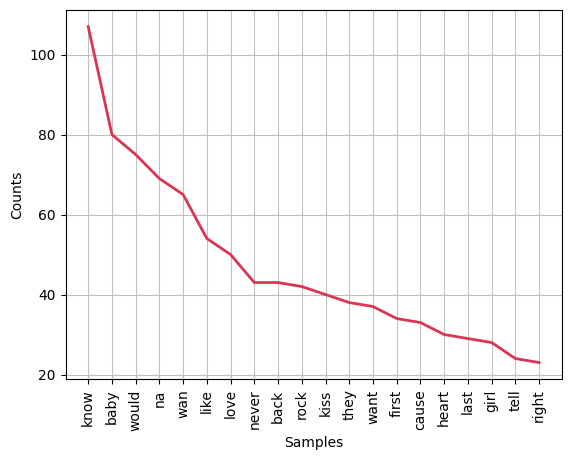

In [30]:
# Importa a classe FreqDist da biblioteca nltk, que é usada para calcular a frequência de distribuição de palavras
from nltk.probability import FreqDist

# Tokeniza o texto, dividindo-o em palavras individuais
words = word_tokenize(text)

# Cria uma distribuição de frequência das palavras no texto
fdist = FreqDist(words)

# Plota o gráfico de distribuição de frequência das 20 palavras mais comuns
# 'cumulative=False' indica que não será um gráfico acumulativo
# 'color' define a cor das barras no gráfico
fdist.plot(20, cumulative=False, color='#D93654')

# Exibe o gráfico gerado na tela
plt.show()

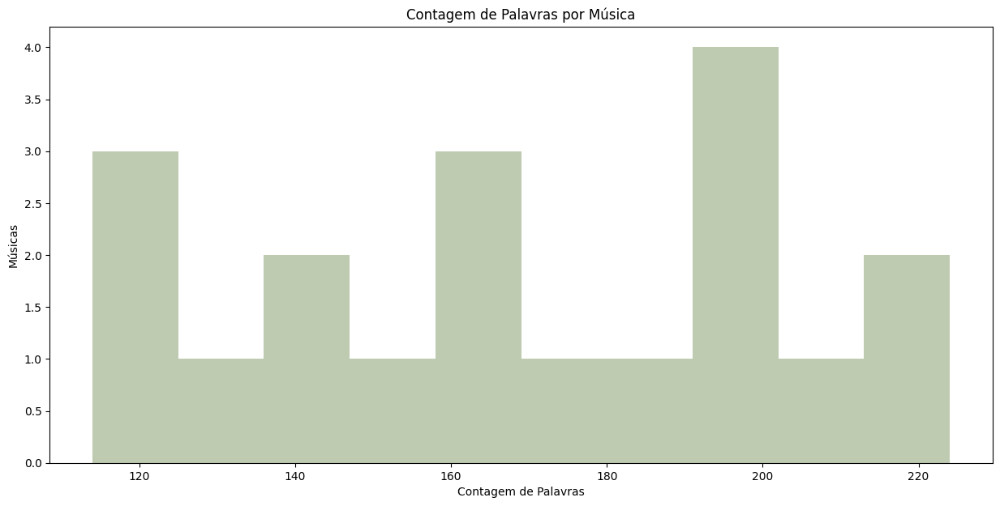

In [31]:
# Define o tamanho da figura do gráfico
plt.figure(figsize=(15, 7))

# Cria um histograma para a coluna 'Word Count' do DataFrame df_dopamine
# '10' especifica o número de bins (intervalos) no histograma
(n, bins, patches) = plt.hist(df_th['Word Count'], bins=10, color='#BECBB1')

# Adiciona rótulo ao eixo x
plt.xlabel('Contagem de Palavras')

# Adiciona rótulo ao eixo y
plt.ylabel('Músicas')

# Adiciona um título ao gráfico
plt.title('Contagem de Palavras por Música')

# Exibe o gráfico
plt.show()

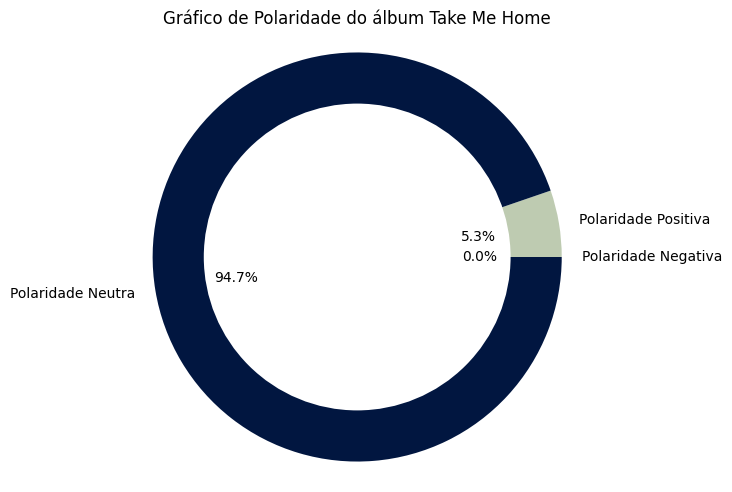

In [33]:
# Importa a classe SentimentIntensityAnalyzer do módulo nltk.sentiment
# Essa classe permite calcular a intensidade do sentimento de um texto
from nltk.sentiment import SentimentIntensityAnalyzer

# Cria uma instância do SentimentIntensityAnalyzer para analisar o sentimento
analyzer = SentimentIntensityAnalyzer()

# Analisa o sentimento de todas as letras juntas
# O método polarity_scores(text) retorna um dicionário com as pontuações de sentimento:
# 'neg' para negativo, 'neu' para neutro, 'pos' para positivo e 'compound' para uma pontuação geral
# Une o dataframe em uma string longa/TextBlob
text = " ".join(twt for twt in df_th['lyrics'])
analyzer.polarity_scores(text)

# Análise de sentimento para cada música (com sentimento neutro incluído)

# Define uma função para obter o sentimento de cada letra individualmente
def fetch_sentiment(x):
    polarity = analyzer.polarity_scores(x)
    # Decide o sentimento com base na pontuação dominante
    if polarity['neu'] > polarity['pos'] and polarity['neu'] > polarity['neg']:
        return 'neu'
    elif polarity['pos'] >= polarity['neg']:
        return 'pos'
    else:
        return 'neg'

# Aplica a função à coluna de letras
sentiment = df_th['lyrics'].apply(fetch_sentiment).value_counts()

# Garante que todas as categorias estejam presentes (mesmo que com 0)
sentiment = sentiment.reindex(['pos', 'neu', 'neg'], fill_value=0)

# Labels e cores
labels = ['Polaridade Positiva', 'Polaridade Neutra', 'Polaridade Negativa']
colors = ['#BECBB1', '#011640', '#D93654']

# Gráfico de pizza
plt.pie(sentiment, labels=labels, autopct='%1.1f%%', colors=colors)

# Círculo central (estilo donut)
cc = plt.Circle((0,0),0.75,fc='#FFFFFF')
fig = plt.gcf()
fig.gca().add_artist(cc)

# Exibição do gráfico
plt.tight_layout()
plt.title('Gráfico de Polaridade do álbum Take Me Home')
plt.axis('equal')
plt.show()

<div style="background-color: #e6f2ff; padding: 10px; border-radius: 5px;">
    <strong>Análise do Gráfico de Polaridade</strong><br>
    O álbum apresenta apenas 5.3% de polaridade positiva, indicando regressão nas composições da artista.
</div>

Index(['title', 'lyrics', 'Album', 'release_year', 'Word Count', 'score',
       'sentiment', 'filter'],
      dtype='object')


<ipython-input-34-d0460ee57296>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_th['lyrics'] = df_th['lyrics'].fillna('')  # Substitui valores nulos por string vazia


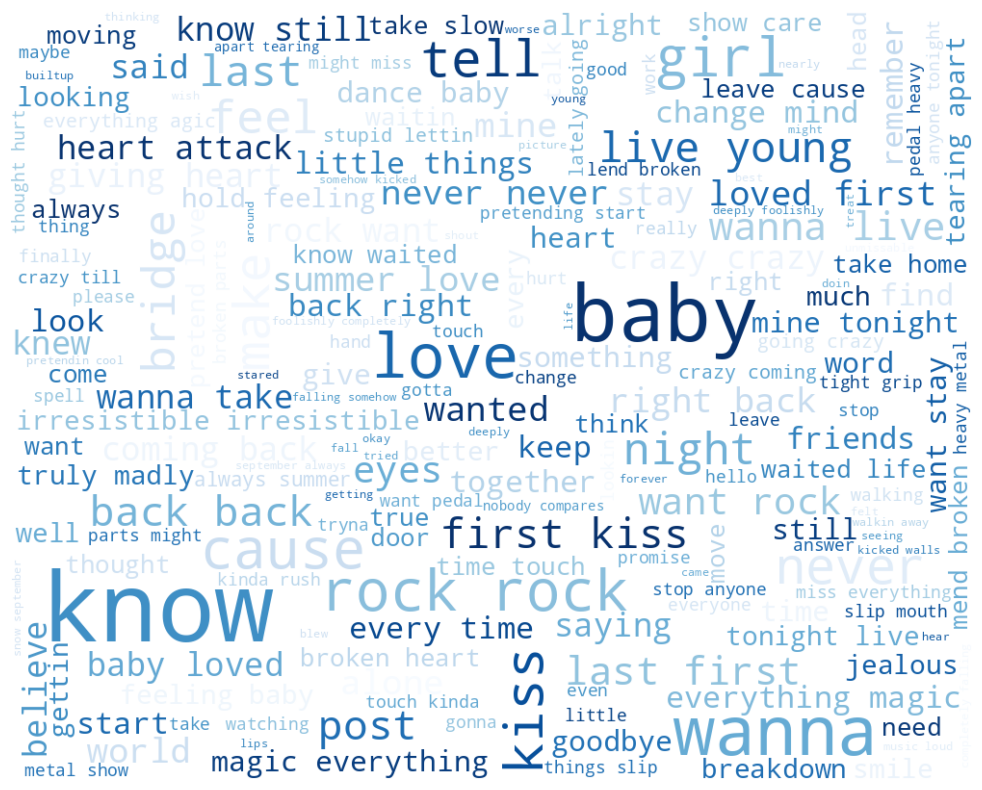

In [34]:
# Exibir os nomes das colunas do DataFrame
print(df_th.columns)

# Verifica se a coluna 'Lyrics' existe
if 'lyrics' in df_th.columns:
    # Verifica se não há valores nulos na coluna 'Lyrics'
    df_th['lyrics'] = df_th['lyrics'].fillna('')  # Substitui valores nulos por string vazia
    text = " ".join(twt for twt in df_th['lyrics'])

    # Gerando a nuvem de palavras com um tema claro
    wc = WordCloud(
        width=1000,
        height=800,
        random_state=21,
        max_font_size=100,
        relative_scaling=0.5,
        colormap="Blues",  # Alterado para um esquema de cores de fundo branco
        background_color="white"  # Define fundo branco explicitamente
    ).generate(text)

    # Exibindo a nuvem de palavras
    plt.figure(figsize=(14, 10))
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.show()
else:
    print("A coluna 'Lyrics' não foi encontrada no DataFrame.")

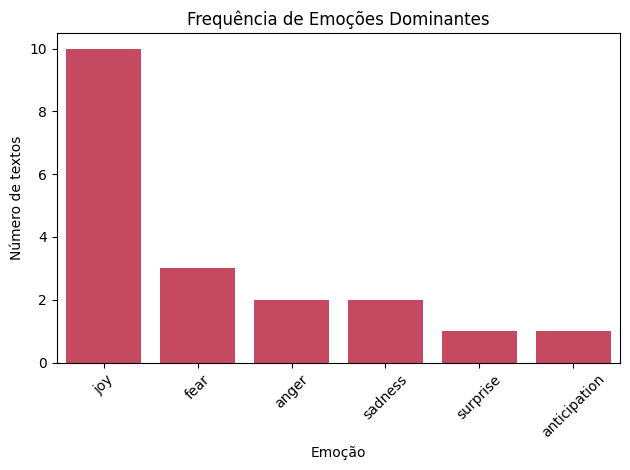

In [35]:
# Construção da barra por contagem
sns.countplot(
    x='sentiment',
    data=df_th,
    order=df_th['sentiment'].value_counts().index,
    color='#D93654'  # cor personalizada
)

#Exibição do gráfico
plt.title('Frequência de Emoções Dominantes')
plt.ylabel('Número de textos')
plt.xlabel('Emoção')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

<div style="background-color: #e6f2ff; padding: 10px; border-radius: 5px;">
    <strong>Análise do Gráfico de Polaridade</strong><br>
    Dominância do sentimento de alegria.
</div>


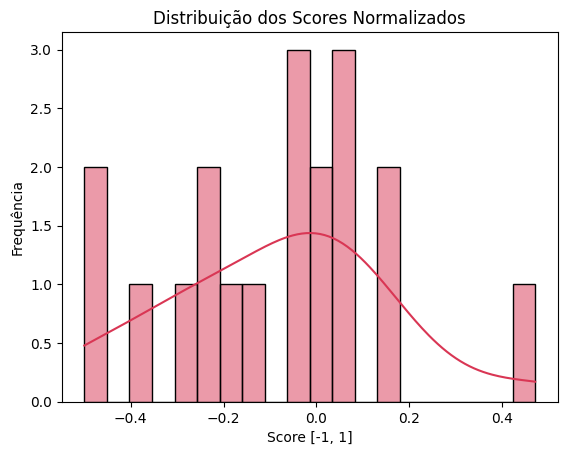

In [36]:
# Gerando o Histograma
sns.histplot(df_th['score'], bins=20, kde=True, color='#D93654')
plt.title('Distribuição dos Scores Normalizados')
plt.xlabel('Score [-1, 1]')
plt.ylabel('Frequência')
plt.show()

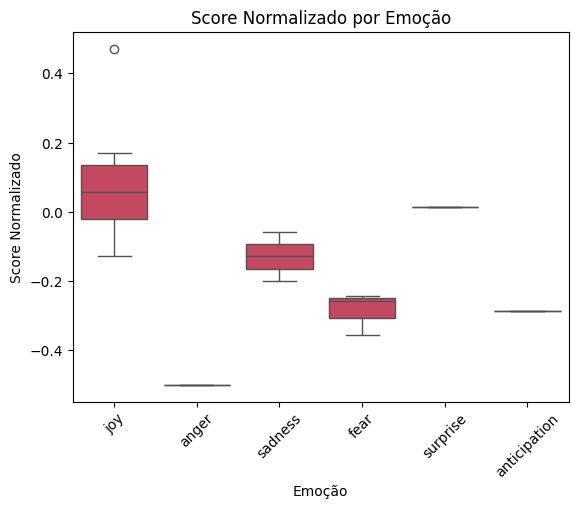

In [37]:
# Gerando o Boxplot
sns.boxplot(x='sentiment', y='score', data=df_th, color='#D93654')
plt.title('Score Normalizado por Emoção')
plt.xlabel('Emoção')
plt.ylabel('Score Normalizado')
plt.xticks(rotation=45)
plt.show()

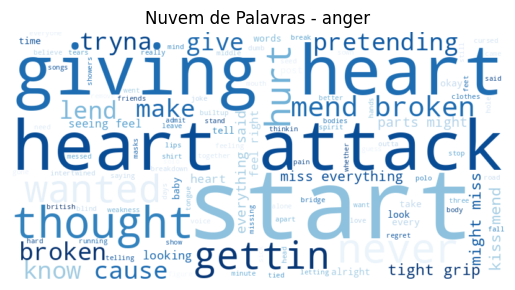

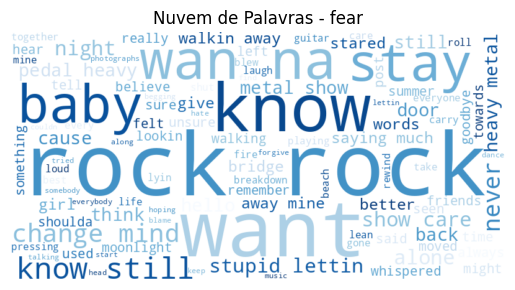

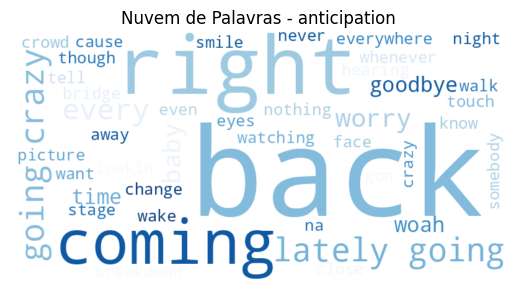

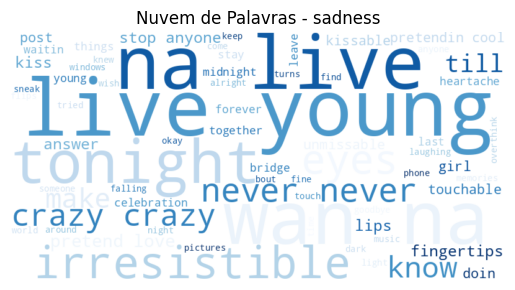

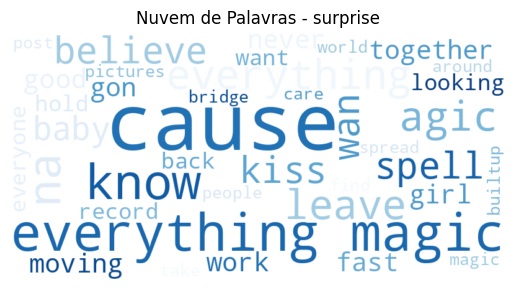

Nenhuma letra encontrada para a emoção 'disgust'.


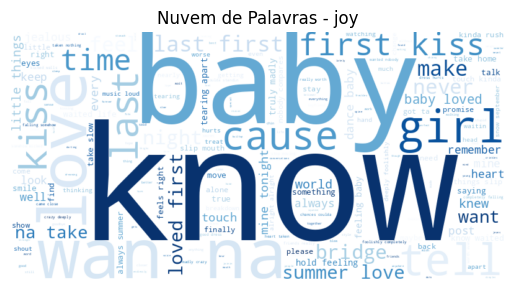

Nenhuma letra encontrada para a emoção 'trust'.


In [38]:
# Gerar a nuvem de palavras para cada emoção
for emotion in emotion_sentiments:
    words = []

    # Verificar se há letras associadas à emoção
    emotion_lyrics = df_th[df_th['sentiment'] == emotion]['lyrics']

    # Verifica se a emoção tem textos associados
    if not emotion_lyrics.empty:
        for text in emotion_lyrics:
            words.extend(word_tokenize(text.lower()))

        # Se houver palavras associadas à emoção
        if words:
            # Gerar a nuvem de palavras com fundo branco e tons de azul
            wordcloud = WordCloud(
                width=800,
                height=400,
                background_color='white',  # Fundo branco
                colormap='Blues'  # Paleta de tons de azul
            ).generate(' '.join(words))

            # Mostrar a nuvem de palavras
            plt.figure()
            plt.imshow(wordcloud, interpolation='bilinear')
            plt.axis('off')
            plt.title(f'Nuvem de Palavras - {emotion}')
            plt.show()
        else:
            print(f"Nenhuma palavra encontrada para a emoção '{emotion}'.")
    else:
        print(f"Nenhuma letra encontrada para a emoção '{emotion}'.")

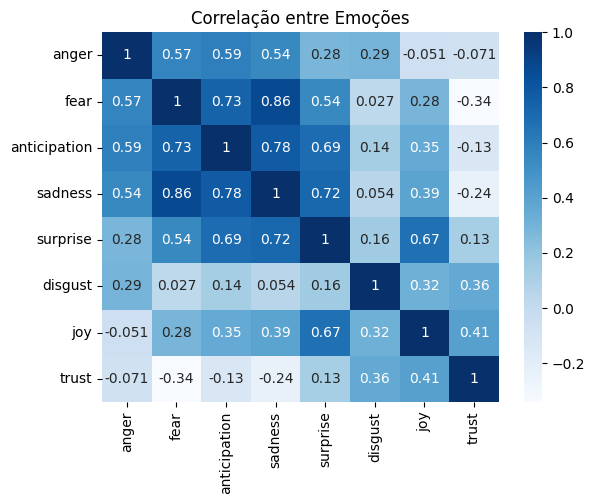

In [39]:
# Contar emoções por texto
emotion_columns = list(emotion_sentiments)
emotion_counts = []

for text in df_th['lyrics']:
    tokens = word_tokenize(text.lower())
    counts = {emotion: 0 for emotion in emotion_columns}
    for token in tokens:
        for emotion in nrc_dict.get(token, []):
            counts[emotion] += 1
    emotion_counts.append(counts)

emotion_df = pd.DataFrame(emotion_counts)

# Gerar o heatmap com tons de azul
sns.heatmap(emotion_df.corr(), annot=True, cmap="Blues")
plt.title("Correlação entre Emoções")
plt.show()

### Análise do álbum Midnight Memories

*Midnight Memories* é o terceiro álbum de estúdio, lançado em 25 de novembro de 2013 através da gravadora *Sony Music Entertainment*. O *single* de avanço para promoção do disco, "Best Song Ever", foi disponibilizado na iTunes Store de todo o mundo em 22 de julho de 2013.

Mais informações em: https://pt.wikipedia.org/wiki/Midnight_Memories

In [40]:
# Filtrando o DataFrame para excluir músicas dos álbuns Reflection, 7/27 e Fifth Harmony
df_mm = df_original_2[df_original_2['Album'].isin(['Midnight Memories (Japan Edition)'])]

# Exibindo o DataFrame filtrado
df_mm

,title,lyrics,Album,release_year,Word Count,score,sentiment,filter
2,Story of My Life,written walls stories explain leave heart open...,Midnight Memories (Japan Edition),2013.0,177,-0.057143,sadness,intenso
9,You & I,figured figured black white seconds hours mayb...,Midnight Memories (Japan Edition),2013.0,115,-0.257143,sadness,intenso
14,Best Song Ever,maybe walked straight heart stole through door...,Midnight Memories (Japan Edition),2013.0,236,-0.142857,surprise,intenso
26,Midnight Memories,three four straight plane hotel just touched d...,Midnight Memories (Japan Edition),2013.0,127,-0.157143,joy,intenso
29,Diana,diana front pages pictures make look small cou...,Midnight Memories (Japan Edition),2013.0,139,-0.385714,fear,intenso
30,Strong,hands hands tied like ships drifting weightles...,Midnight Memories (Japan Edition),2013.0,127,-0.085714,joy,intenso
34,Through the Dark,tell lost tell tears stay know hidin wanna tel...,Midnight Memories (Japan Edition),2013.0,157,-0.200000,sadness,neutro
35,Right Now,lights down night calling hear voices singing ...,Midnight Memories (Japan Edition),2013.0,116,-0.257143,anticipation,intenso
39,Happily,understand understand hold hand meant twist fa...,Midnight Memories (Japan Edition),2013.0,132,-0.500000,fear,intenso
42,Better Than Words,better words more feeling crazy love dancing c...,Midnight Memories (Japan Edition),2013.0,160,0.071429,anger,intenso


In [41]:
# Une o dataframe em uma string longa/TextBlob
text = " ".join(twt for twt in df_mm['lyrics'])
palavras = word_tokenize(text)

print("Existem {} palavras no dataset de letra.".format(len(palavras)))
print("Existem {} palavras únicas no dataset de letras.".format(len(set(palavras))))

Existem 2035 palavras no dataset de letra.
Existem 438 palavras únicas no dataset de letras.


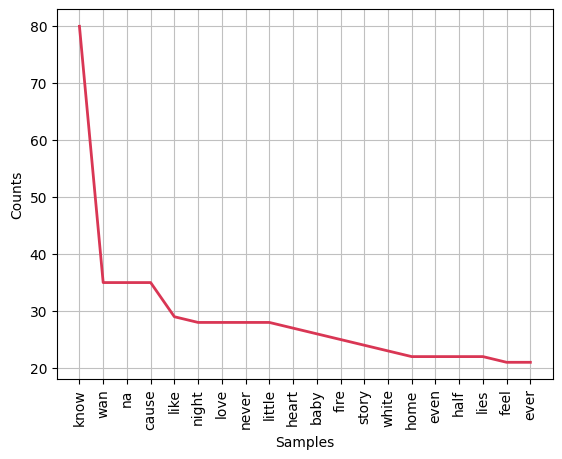

In [42]:
# Importa a classe FreqDist da biblioteca nltk, que é usada para calcular a frequência de distribuição de palavras
from nltk.probability import FreqDist

# Tokeniza o texto, dividindo-o em palavras individuais
words = word_tokenize(text)

# Cria uma distribuição de frequência das palavras no texto
fdist = FreqDist(words)

# Plota o gráfico de distribuição de frequência das 20 palavras mais comuns
# 'cumulative=False' indica que não será um gráfico acumulativo
# 'color' define a cor das barras no gráfico
fdist.plot(20, cumulative=False, color='#D93654')

# Exibe o gráfico gerado na tela
plt.show()

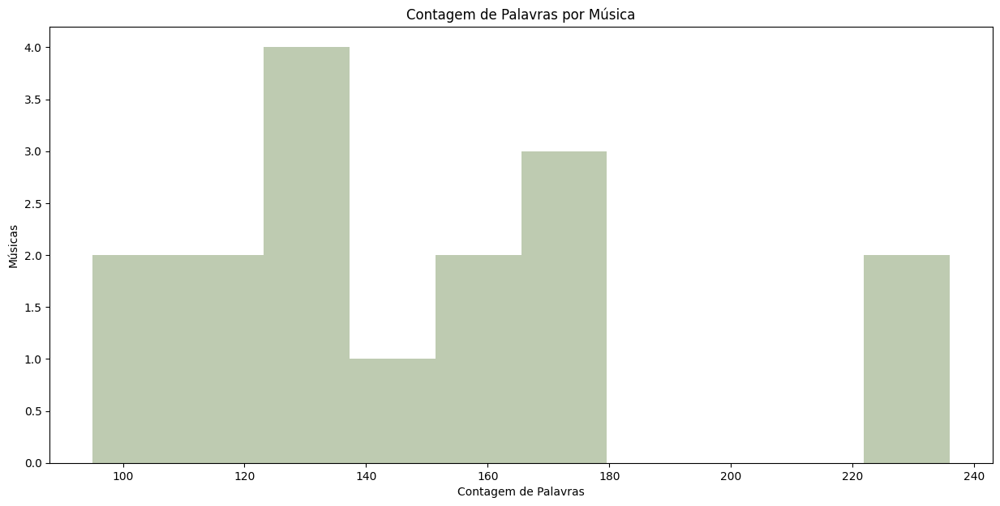

In [43]:
# Define o tamanho da figura do gráfico
plt.figure(figsize=(15, 7))

# Cria um histograma para a coluna 'Word Count' do DataFrame df_dopamine
# '10' especifica o número de bins (intervalos) no histograma
(n, bins, patches) = plt.hist(df_mm['Word Count'], bins=10, color='#BECBB1')

# Adiciona rótulo ao eixo x
plt.xlabel('Contagem de Palavras')

# Adiciona rótulo ao eixo y
plt.ylabel('Músicas')

# Adiciona um título ao gráfico
plt.title('Contagem de Palavras por Música')

# Exibe o gráfico
plt.show()

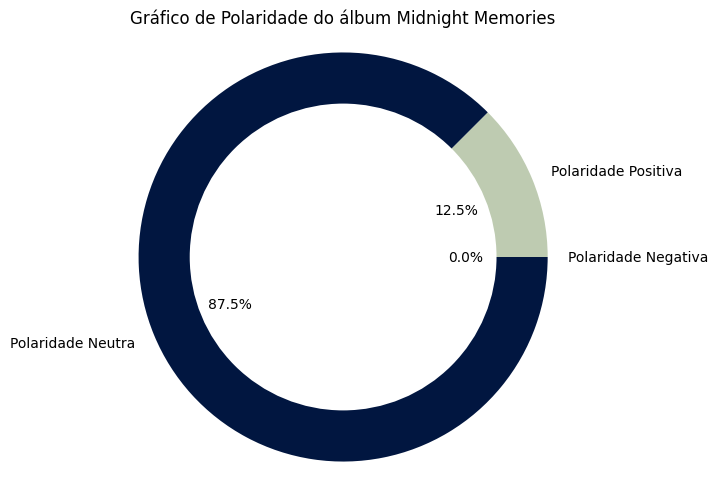

In [44]:
# Importa a classe SentimentIntensityAnalyzer do módulo nltk.sentiment
# Essa classe permite calcular a intensidade do sentimento de um texto
from nltk.sentiment import SentimentIntensityAnalyzer

# Cria uma instância do SentimentIntensityAnalyzer para analisar o sentimento
analyzer = SentimentIntensityAnalyzer()

# Analisa o sentimento de todas as letras juntas
# O método polarity_scores(text) retorna um dicionário com as pontuações de sentimento:
# 'neg' para negativo, 'neu' para neutro, 'pos' para positivo e 'compound' para uma pontuação geral
# Une o dataframe em uma string longa/TextBlob
text = " ".join(twt for twt in df_mm['lyrics'])
analyzer.polarity_scores(text)

# Análise de sentimento para cada música (com sentimento neutro incluído)

# Define uma função para obter o sentimento de cada letra individualmente
def fetch_sentiment(x):
    polarity = analyzer.polarity_scores(x)
    # Decide o sentimento com base na pontuação dominante
    if polarity['neu'] > polarity['pos'] and polarity['neu'] > polarity['neg']:
        return 'neu'
    elif polarity['pos'] >= polarity['neg']:
        return 'pos'
    else:
        return 'neg'

# Aplica a função à coluna de letras
sentiment = df_mm['lyrics'].apply(fetch_sentiment).value_counts()

# Garante que todas as categorias estejam presentes (mesmo que com 0)
sentiment = sentiment.reindex(['pos', 'neu', 'neg'], fill_value=0)

# Labels e cores
labels = ['Polaridade Positiva', 'Polaridade Neutra', 'Polaridade Negativa']
colors = ['#BECBB1', '#011640', '#D93654']

# Gráfico de pizza
plt.pie(sentiment, labels=labels, autopct='%1.1f%%', colors=colors)

# Círculo central (estilo donut)
cc = plt.Circle((0,0),0.75,fc='#FFFFFF')
fig = plt.gcf()
fig.gca().add_artist(cc)

# Exibição do gráfico
plt.tight_layout()
plt.title('Gráfico de Polaridade do álbum Midnight Memories')
plt.axis('equal')
plt.show()

<div style="background-color: #e6f2ff; padding: 10px; border-radius: 5px;">
    <strong>Análise do Gráfico de Polaridade</strong><br>
    O álbum apresenta 12.5% de polaridade positiva, mostrando evolução e versatilidade na identidade visual.
</div>

Index(['title', 'lyrics', 'Album', 'release_year', 'Word Count', 'score',
       'sentiment', 'filter'],
      dtype='object')


<ipython-input-45-ad3f8e0bfdf8>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_mm['lyrics'] = df_mm['lyrics'].fillna('')  # Substitui valores nulos por string vazia


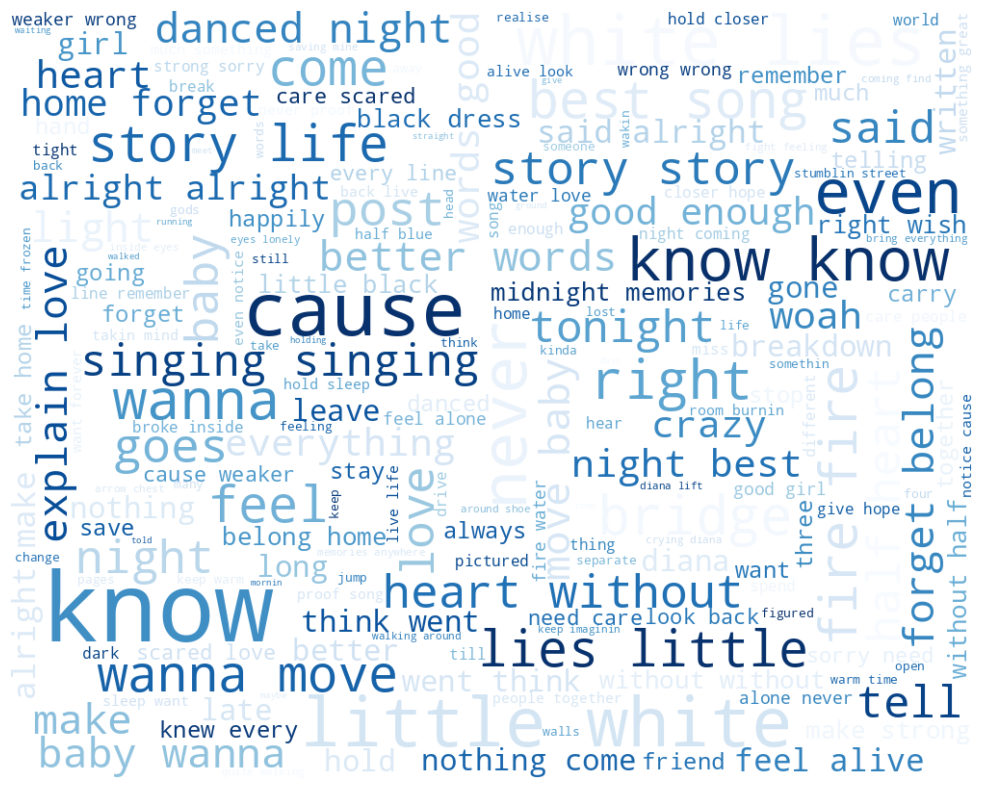

In [45]:
# Exibir os nomes das colunas do DataFrame
print(df_mm.columns)

# Verifica se a coluna 'Lyrics' existe
if 'lyrics' in df_mm.columns:
    # Verifica se não há valores nulos na coluna 'Lyrics'
    df_mm['lyrics'] = df_mm['lyrics'].fillna('')  # Substitui valores nulos por string vazia
    text = " ".join(twt for twt in df_mm['lyrics'])

    # Gerando a nuvem de palavras com um tema claro
    wc = WordCloud(
        width=1000,
        height=800,
        random_state=21,
        max_font_size=100,
        relative_scaling=0.5,
        colormap="Blues",  # Alterado para um esquema de cores de fundo branco
        background_color="white"  # Define fundo branco explicitamente
    ).generate(text)

    # Exibindo a nuvem de palavras
    plt.figure(figsize=(14, 10))
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.show()
else:
    print("A coluna 'Lyrics' não foi encontrada no DataFrame.")

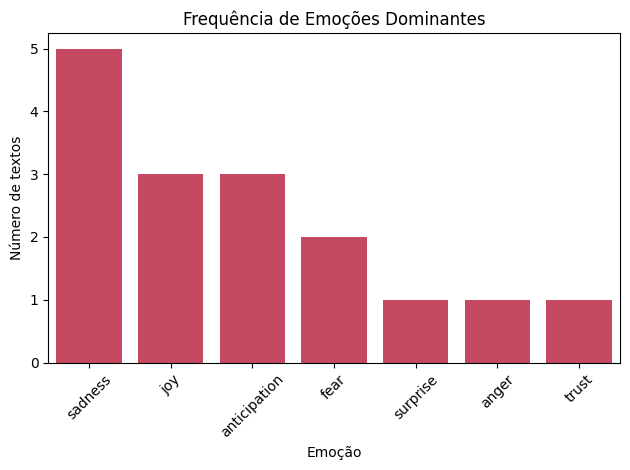

In [46]:
# Construção da barra por contagem
sns.countplot(
    x='sentiment',
    data=df_mm,
    order=df_mm['sentiment'].value_counts().index,
    color='#D93654'  # cor personalizada
)

#Exibição do gráfico
plt.title('Frequência de Emoções Dominantes')
plt.ylabel('Número de textos')
plt.xlabel('Emoção')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

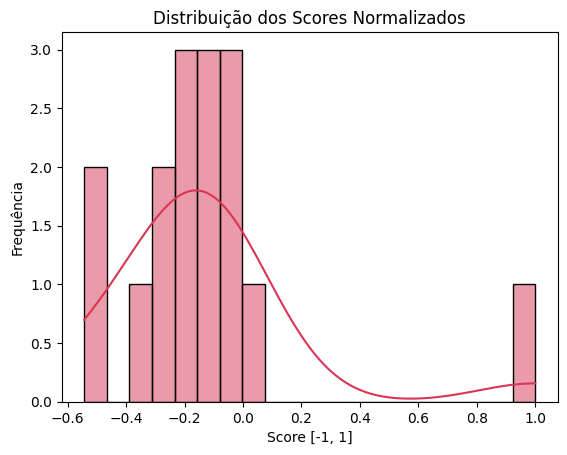

In [47]:
# Gerando o Histograma
sns.histplot(df_mm['score'], bins=20, kde=True, color='#D93654')
plt.title('Distribuição dos Scores Normalizados')
plt.xlabel('Score [-1, 1]')
plt.ylabel('Frequência')
plt.show()

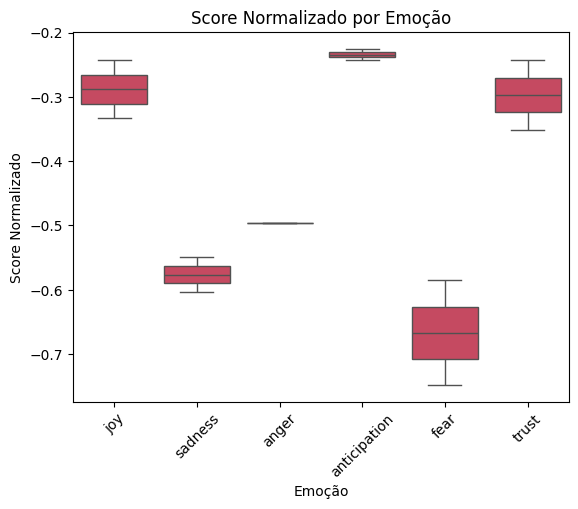

In [ ]:
# Gerando o Boxplot
sns.boxplot(x='sentiment', y='score', data=df_mm, color='#D93654')
plt.title('Score Normalizado por Emoção')
plt.xlabel('Emoção')
plt.ylabel('Score Normalizado')
plt.xticks(rotation=45)
plt.show()

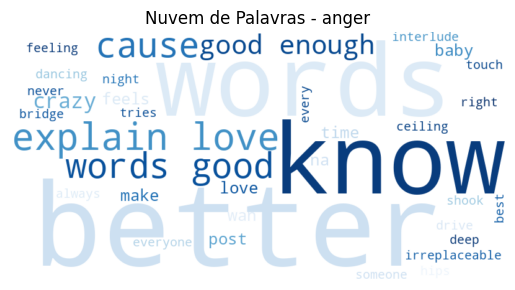

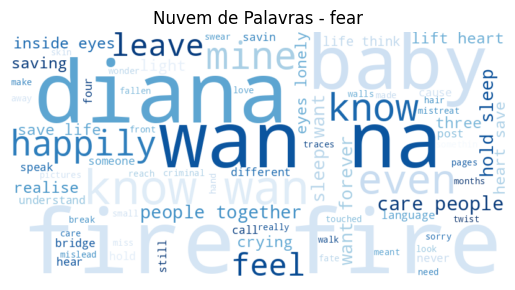

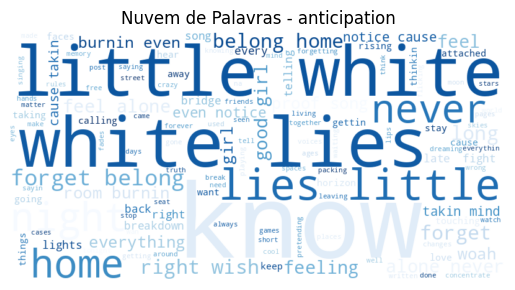

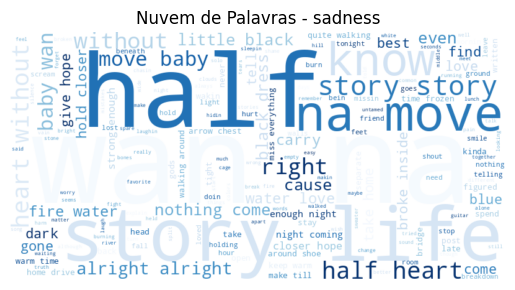

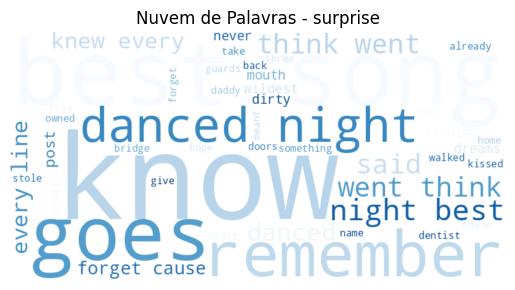

Nenhuma letra encontrada para a emoção 'disgust'.


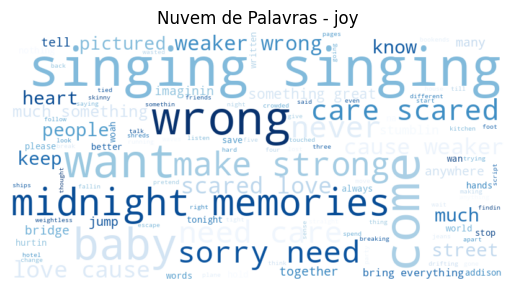

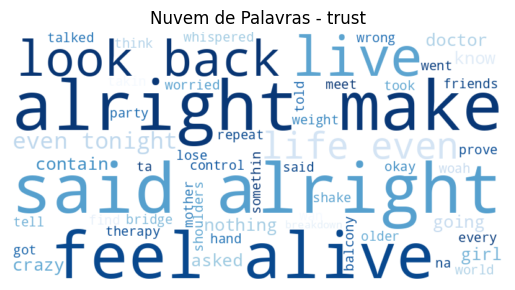

In [48]:
# Gerar a nuvem de palavras para cada emoção
for emotion in emotion_sentiments:
    words = []

    # Verificar se há letras associadas à emoção
    emotion_lyrics = df_mm[df_mm['sentiment'] == emotion]['lyrics']

    # Verifica se a emoção tem textos associados
    if not emotion_lyrics.empty:
        for text in emotion_lyrics:
            words.extend(word_tokenize(text.lower()))

        # Se houver palavras associadas à emoção
        if words:
            # Gerar a nuvem de palavras com fundo branco e tons de azul
            wordcloud = WordCloud(
                width=800,
                height=400,
                background_color='white',  # Fundo branco
                colormap='Blues'  # Paleta de tons de azul
            ).generate(' '.join(words))

            # Mostrar a nuvem de palavras
            plt.figure()
            plt.imshow(wordcloud, interpolation='bilinear')
            plt.axis('off')
            plt.title(f'Nuvem de Palavras - {emotion}')
            plt.show()
        else:
            print(f"Nenhuma palavra encontrada para a emoção '{emotion}'.")
    else:
        print(f"Nenhuma letra encontrada para a emoção '{emotion}'.")

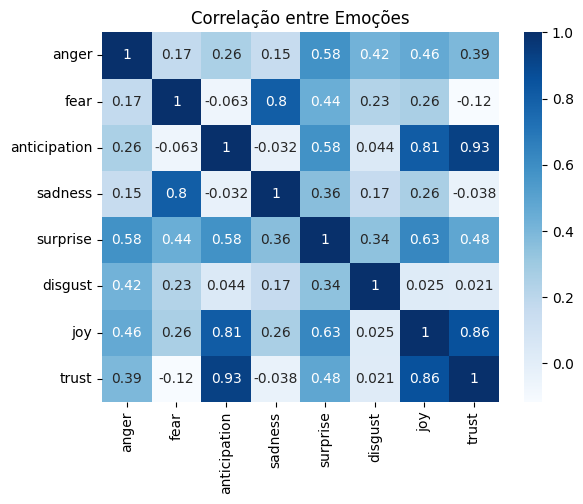

In [49]:
# Contar emoções por texto
emotion_columns = list(emotion_sentiments)
emotion_counts = []

for text in df_mm['lyrics']:
    tokens = word_tokenize(text.lower())
    counts = {emotion: 0 for emotion in emotion_columns}
    for token in tokens:
        for emotion in nrc_dict.get(token, []):
            counts[emotion] += 1
    emotion_counts.append(counts)

emotion_df = pd.DataFrame(emotion_counts)

# Gerar o heatmap com tons de azul
sns.heatmap(emotion_df.corr(), annot=True, cmap="Blues")
plt.title("Correlação entre Emoções")
plt.show()

### Análise do álbum Four

Four é o quarto álbum de estúdio, lançado em 17 de novembro de 2014, através das editoras discográficas *Columbia Records* e *Syco Music*.[1] O *single* de avanço para promoção do disco, "Steal My Girl", foi lançado em 29 de setembro mundialmente, exceto no Reino Unido. É o último álbum da banda com a participação de Zayn Malik.

Mais informações em: https://pt.wikipedia.org/wiki/Four_(%C3%A1lbum_de_One_Direction)

In [50]:
# Filtrando o DataFrame para excluir músicas dos álbuns Reflection, 7/27 e Fifth Harmony
df_four = df_original_3[df_original_3['Album'].isin(['FOUR (The Ultimate Edition)'])]

# Exibindo o DataFrame filtrado
df_four

,title,lyrics,Album,release_year,Word Count,score,sentiment,filter
0,Night Changes,goin tonight changes somethin mother like kind...,FOUR (The Ultimate Edition),2014.0,164,-0.314286,fear,intenso
5,18,heart soul believe both made start false know ...,FOUR (The Ultimate Edition),2014.0,155,0.314286,anticipation,intenso
10,Steal My Girl,queen since sixteen want things dream dreams a...,FOUR (The Ultimate Edition),2014.0,216,-0.700000,fear,intenso
11,No Control,stained coffee just fingerprint lipstick enoug...,FOUR (The Ultimate Edition),2014.0,121,-0.385714,trust,intenso
18,Fool’s Gold,like crow wire shinin distraction makes home l...,FOUR (The Ultimate Edition),2014.0,94,-0.342857,sadness,intenso
21,Stockholm Syndrome,shadow holding hostage days whisper telling ne...,FOUR (The Ultimate Edition),2014.0,157,0.128571,joy,intenso
28,Where Do Broken Hearts Go,counted mistakes there standin list things don...,FOUR (The Ultimate Edition),2014.0,204,-1.000000,fear,intenso
37,Fireproof,think gonna lose mind something deep inside gi...,FOUR (The Ultimate Edition),2014.0,107,0.100000,joy,intenso
41,Girl Almighty,light loud many ambulances takes save saviour ...,FOUR (The Ultimate Edition),2014.0,136,0.257143,joy,intenso
48,Clouds,clouds clouds know like complicated keep simpl...,FOUR (The Ultimate Edition),2014.0,162,-0.042857,joy,intenso


In [51]:
# Une o dataframe em uma string longa/TextBlob
text = " ".join(twt for twt in df_four['lyrics'])
palavras = word_tokenize(text)

print("Existem {} palavras no dataset de letra.".format(len(palavras)))
print("Existem {} palavras únicas no dataset de letras.".format(len(set(palavras))))

Existem 2036 palavras no dataset de letra.
Existem 485 palavras únicas no dataset de letras.


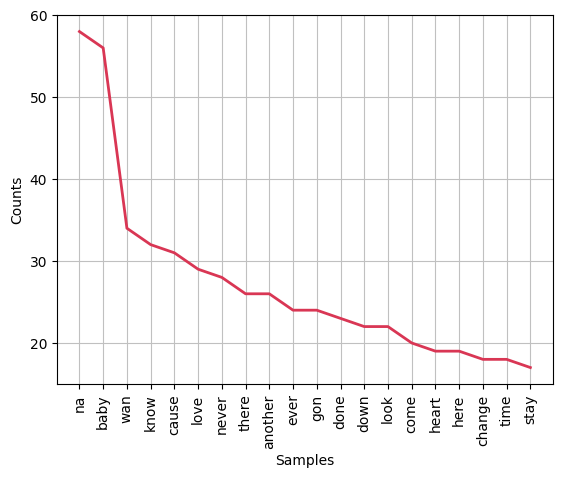

In [52]:
# Importa a classe FreqDist da biblioteca nltk, que é usada para calcular a frequência de distribuição de palavras
from nltk.probability import FreqDist

# Tokeniza o texto, dividindo-o em palavras individuais
words = word_tokenize(text)

# Cria uma distribuição de frequência das palavras no texto
fdist = FreqDist(words)

# Plota o gráfico de distribuição de frequência das 20 palavras mais comuns
# 'cumulative=False' indica que não será um gráfico acumulativo
# 'color' define a cor das barras no gráfico
fdist.plot(20, cumulative=False, color='#D93654')

# Exibe o gráfico gerado na tela
plt.show()

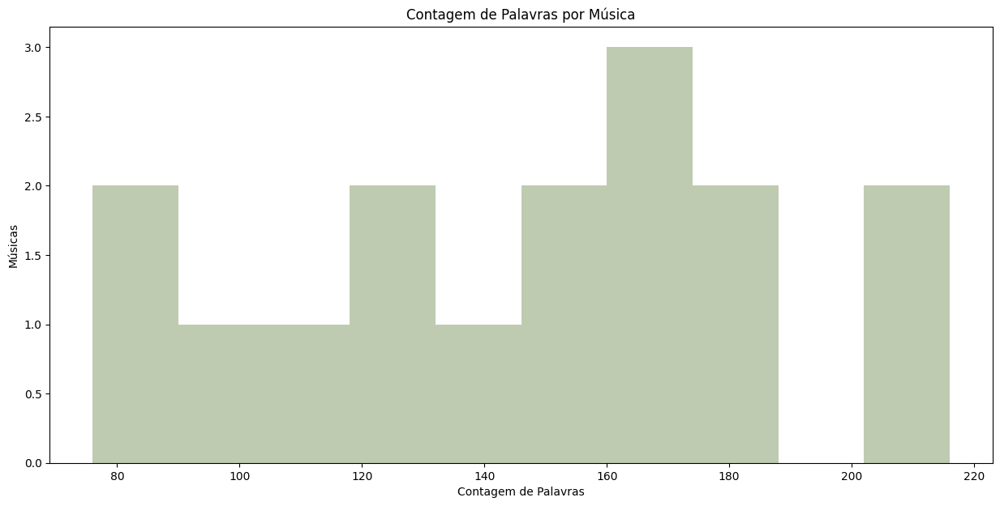

In [53]:
# Define o tamanho da figura do gráfico
plt.figure(figsize=(15, 7))

# Cria um histograma para a coluna 'Word Count' do DataFrame df_dopamine
# '10' especifica o número de bins (intervalos) no histograma
(n, bins, patches) = plt.hist(df_four['Word Count'], bins=10, color='#BECBB1')

# Adiciona rótulo ao eixo x
plt.xlabel('Contagem de Palavras')

# Adiciona rótulo ao eixo y
plt.ylabel('Músicas')

# Adiciona um título ao gráfico
plt.title('Contagem de Palavras por Música')

# Exibe o gráfico
plt.show()

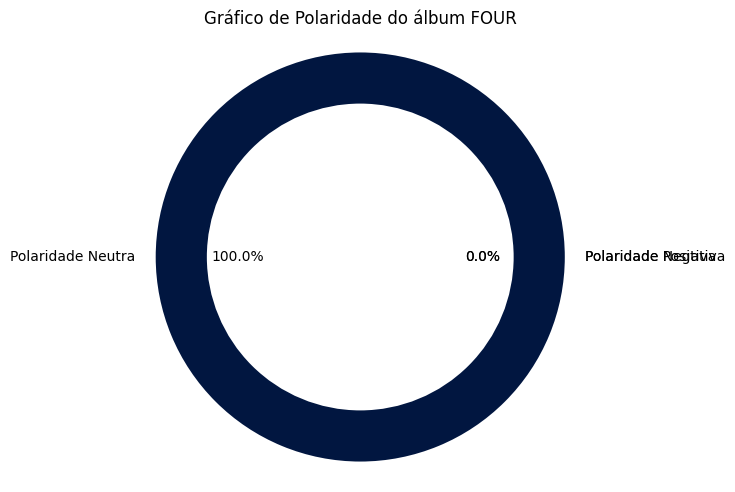

In [54]:
# Importa a classe SentimentIntensityAnalyzer do módulo nltk.sentiment
# Essa classe permite calcular a intensidade do sentimento de um texto
from nltk.sentiment import SentimentIntensityAnalyzer

# Cria uma instância do SentimentIntensityAnalyzer para analisar o sentimento
analyzer = SentimentIntensityAnalyzer()

# Analisa o sentimento de todas as letras juntas
# O método polarity_scores(text) retorna um dicionário com as pontuações de sentimento:
# 'neg' para negativo, 'neu' para neutro, 'pos' para positivo e 'compound' para uma pontuação geral
# Une o dataframe em uma string longa/TextBlob
text = " ".join(twt for twt in df_four['lyrics'])
analyzer.polarity_scores(text)

# Análise de sentimento para cada música (com sentimento neutro incluído)

# Define uma função para obter o sentimento de cada letra individualmente
def fetch_sentiment(x):
    polarity = analyzer.polarity_scores(x)
    # Decide o sentimento com base na pontuação dominante
    if polarity['neu'] > polarity['pos'] and polarity['neu'] > polarity['neg']:
        return 'neu'
    elif polarity['pos'] >= polarity['neg']:
        return 'pos'
    else:
        return 'neg'

# Aplica a função à coluna de letras
sentiment = df_four['lyrics'].apply(fetch_sentiment).value_counts()

# Garante que todas as categorias estejam presentes (mesmo que com 0)
sentiment = sentiment.reindex(['pos', 'neu', 'neg'], fill_value=0)

# Labels e cores
labels = ['Polaridade Positiva', 'Polaridade Neutra', 'Polaridade Negativa']
colors = ['#BECBB1', '#011640', '#D93654']

# Gráfico de pizza
plt.pie(sentiment, labels=labels, autopct='%1.1f%%', colors=colors)

# Círculo central (estilo donut)
cc = plt.Circle((0,0),0.75,fc='#FFFFFF')
fig = plt.gcf()
fig.gca().add_artist(cc)

# Exibição do gráfico
plt.tight_layout()
plt.title('Gráfico de Polaridade do álbum FOUR')
plt.axis('equal')
plt.show()

<div style="background-color: #e6f2ff; padding: 10px; border-radius: 5px;">
    <strong>Análise do Gráfico de Polaridade</strong><br>
    O álbum apresenta apenas polaridade neutra.
</div>

Index(['title', 'lyrics', 'Album', 'release_year', 'Word Count', 'score',
       'sentiment', 'filter'],
      dtype='object')


<ipython-input-55-22f5548af466>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_four['lyrics'] = df_four['lyrics'].fillna('')  # Substitui valores nulos por string vazia


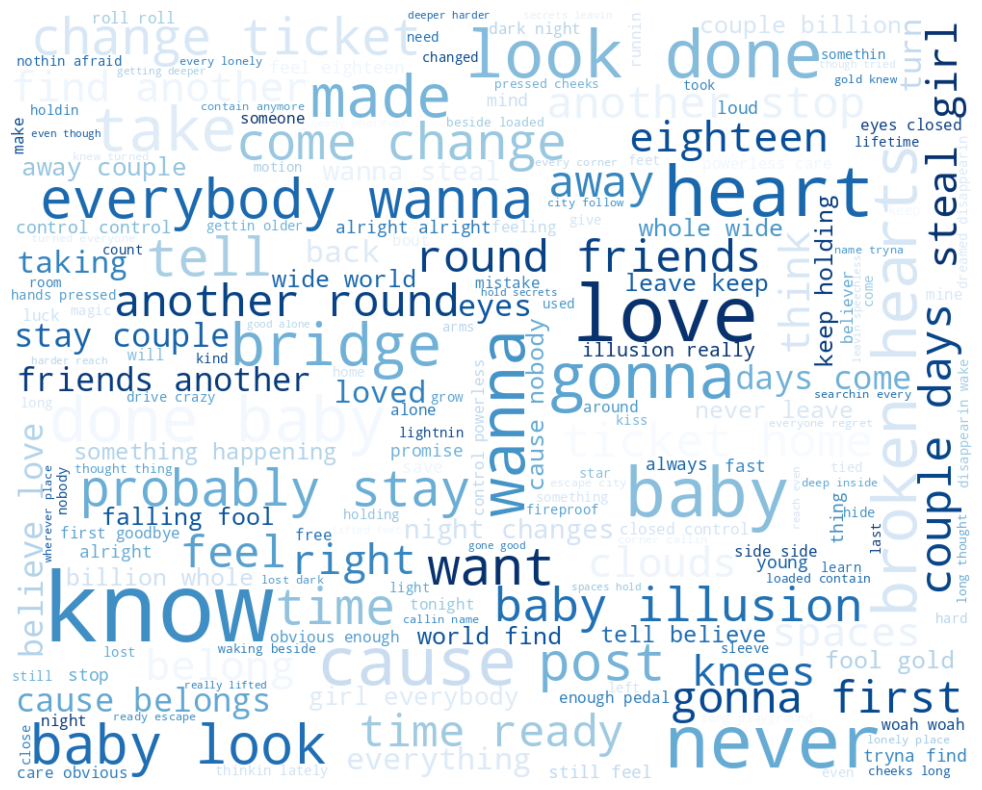

In [55]:
# Exibir os nomes das colunas do DataFrame
print(df_four.columns)

# Verifica se a coluna 'Lyrics' existe
if 'lyrics' in df_four.columns:
    # Verifica se não há valores nulos na coluna 'Lyrics'
    df_four['lyrics'] = df_four['lyrics'].fillna('')  # Substitui valores nulos por string vazia
    text = " ".join(twt for twt in df_four['lyrics'])

    # Gerando a nuvem de palavras com um tema claro
    wc = WordCloud(
        width=1000,
        height=800,
        random_state=21,
        max_font_size=100,
        relative_scaling=0.5,
        colormap="Blues",  # Alterado para um esquema de cores de fundo branco
        background_color="white"  # Define fundo branco explicitamente
    ).generate(text)

    # Exibindo a nuvem de palavras
    plt.figure(figsize=(14, 10))
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.show()
else:
    print("A coluna 'Lyrics' não foi encontrada no DataFrame.")

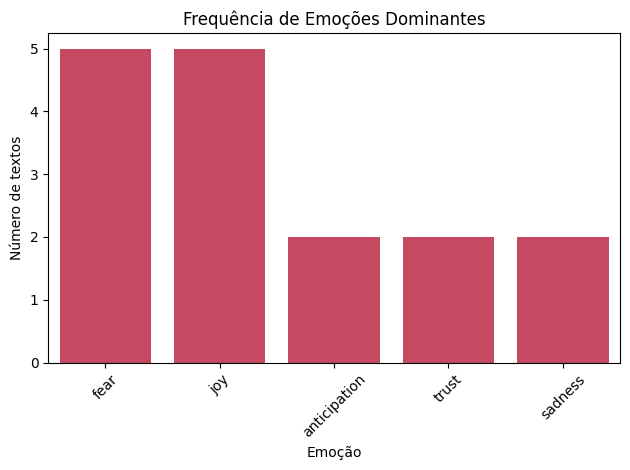

In [56]:
# Construção da barra por contagem
sns.countplot(
    x='sentiment',
    data=df_four,
    order=df_four['sentiment'].value_counts().index,
    color='#D93654'  # cor personalizada
)

#Exibição do gráfico
plt.title('Frequência de Emoções Dominantes')
plt.ylabel('Número de textos')
plt.xlabel('Emoção')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

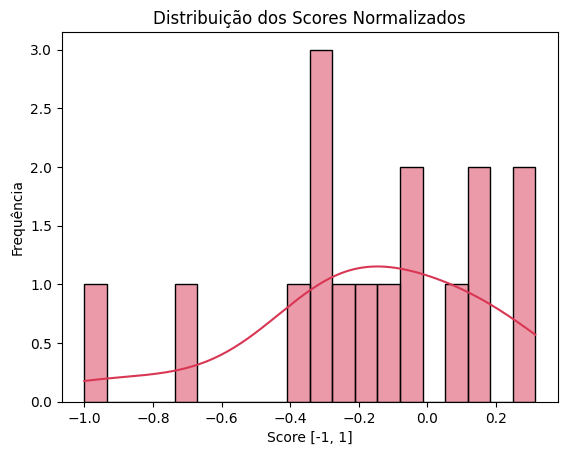

In [57]:
# Gerando o Histograma
sns.histplot(df_four['score'], bins=20, kde=True, color='#D93654')
plt.title('Distribuição dos Scores Normalizados')
plt.xlabel('Score [-1, 1]')
plt.ylabel('Frequência')
plt.show()

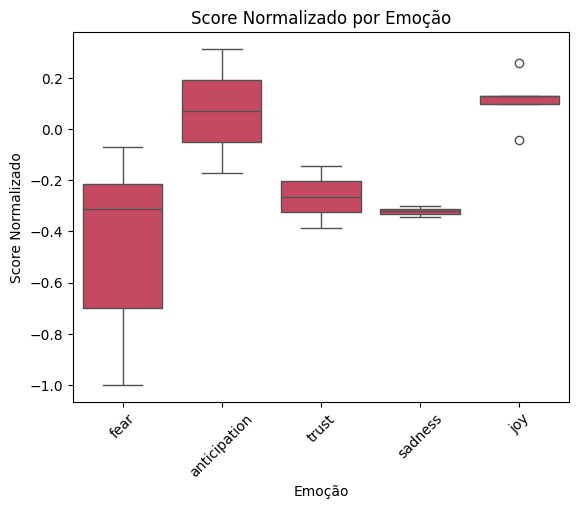

In [58]:
# Gerando o Boxplot
sns.boxplot(x='sentiment', y='score', data=df_four, color='#D93654')
plt.title('Score Normalizado por Emoção')
plt.xlabel('Emoção')
plt.ylabel('Score Normalizado')
plt.xticks(rotation=45)
plt.show()

Nenhuma letra encontrada para a emoção 'anger'.


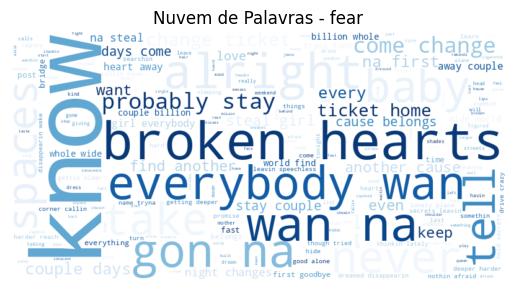

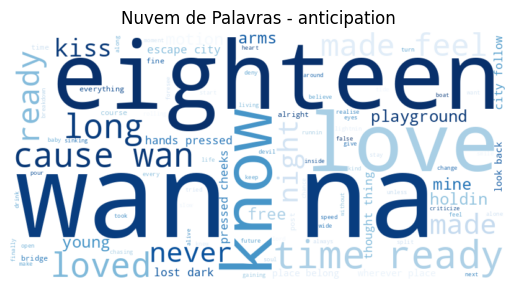

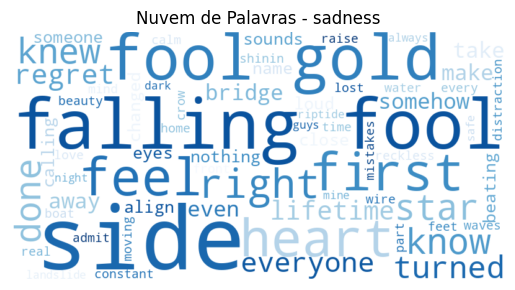

Nenhuma letra encontrada para a emoção 'surprise'.
Nenhuma letra encontrada para a emoção 'disgust'.


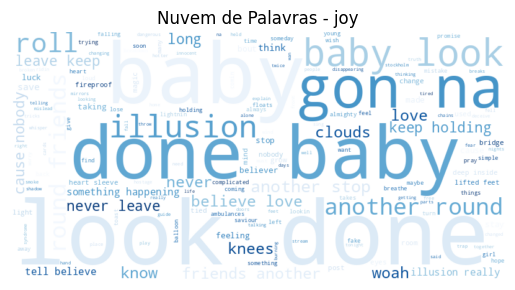

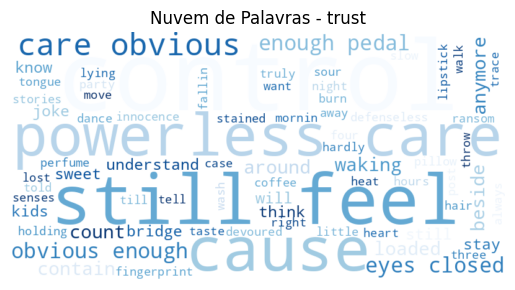

In [59]:
# Gerar a nuvem de palavras para cada emoção
for emotion in emotion_sentiments:
    words = []

    # Verificar se há letras associadas à emoção
    emotion_lyrics = df_four[df_four['sentiment'] == emotion]['lyrics']

    # Verifica se a emoção tem textos associados
    if not emotion_lyrics.empty:
        for text in emotion_lyrics:
            words.extend(word_tokenize(text.lower()))

        # Se houver palavras associadas à emoção
        if words:
            # Gerar a nuvem de palavras com fundo branco e tons de azul
            wordcloud = WordCloud(
                width=800,
                height=400,
                background_color='white',  # Fundo branco
                colormap='Blues'  # Paleta de tons de azul
            ).generate(' '.join(words))

            # Mostrar a nuvem de palavras
            plt.figure()
            plt.imshow(wordcloud, interpolation='bilinear')
            plt.axis('off')
            plt.title(f'Nuvem de Palavras - {emotion}')
            plt.show()
        else:
            print(f"Nenhuma palavra encontrada para a emoção '{emotion}'.")
    else:
        print(f"Nenhuma letra encontrada para a emoção '{emotion}'.")

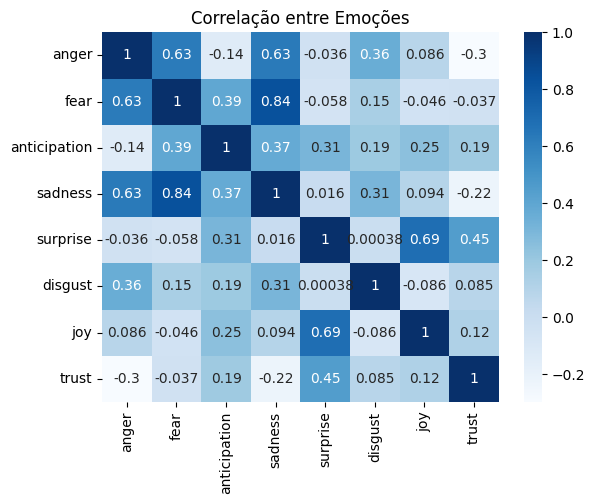

In [60]:
# Contar emoções por texto
emotion_columns = list(emotion_sentiments)
emotion_counts = []

for text in df_four['lyrics']:
    tokens = word_tokenize(text.lower())
    counts = {emotion: 0 for emotion in emotion_columns}
    for token in tokens:
        for emotion in nrc_dict.get(token, []):
            counts[emotion] += 1
    emotion_counts.append(counts)

emotion_df = pd.DataFrame(emotion_counts)

# Gerar o heatmap com tons de azul
sns.heatmap(emotion_df.corr(), annot=True, cmap="Blues")
plt.title("Correlação entre Emoções")
plt.show()

### Análise do álbum Made In The A.M.

*Made In The A.M.* é o quinto e último álbum de estúdio gravado, lançado em 13 de novembro de 2015 sob distribuição da editora discográfica *Columbia Records*. Este é o primeiro álbum do grupo sem o membro Zayn Malik, que anunciou sua saída em 25 de março de 2015. É também o último lançamento com Liam Payne, que faleceu em 16 de outubro de 2024, em Buenos Aires, na Argentina.

Mais informações em: https://pt.wikipedia.org/wiki/Made_in_the_A.M.

In [61]:
# Filtrando o DataFrame para excluir músicas dos álbuns Reflection, 7/27 e Fifth Harmony
df_am = df_original_4[df_original_4['Album'].isin(['Made In The A.M. (Ultimate Fan Edition) [Japan Import]'])]

# Exibindo o DataFrame filtrado
df_am

,title,lyrics,Album,release_year,Word Count,score,sentiment,filter
3,Perfect,might never knight shinin armour might never t...,Made In The A.M. (Ultimate Fan Edition) [Japan...,2015.0,210,1.000000,joy,intenso
4,Drag Me Down,fire heart scared dark never seen look easy ri...,Made In The A.M. (Ultimate Fan Edition) [Japan...,2015.0,197,-0.157143,joy,intenso
6,History,gotta help losing mind keep getting feelin wan...,Made In The A.M. (Ultimate Fan Edition) [Japan...,2015.0,154,0.085714,trust,intenso
7,If I Could Fly,could coming right back home think might give ...,Made In The A.M. (Ultimate Fan Edition) [Japan...,2015.0,137,-0.342857,fear,intenso
12,Infinity,down earth keep falling know hurts going faste...,Made In The A.M. (Ultimate Fan Edition) [Japan...,2015.0,220,1.000000,trust,intenso
13,Olivia,spoken forty three then gotta play opposite pa...,Made In The A.M. (Ultimate Fan Edition) [Japan...,2015.0,132,0.014286,joy,intenso
15,A.M.,stay till favourite conversations always made ...,Made In The A.M. (Ultimate Fan Edition) [Japan...,2015.0,170,-0.185714,anticipation,neutro
16,Walking in the Wind,week said believe never lost look find region ...,Made In The A.M. (Ultimate Fan Edition) [Japan...,2015.0,115,0.071429,joy,intenso
17,Love You Goodbye,inevitable everything good comes impossible kn...,Made In The A.M. (Ultimate Fan Edition) [Japan...,2015.0,131,0.057143,joy,intenso
20,What a Feeling,through wire wire wire watching dance dress ca...,Made In The A.M. (Ultimate Fan Edition) [Japan...,2015.0,160,-0.271429,sadness,intenso


In [62]:
# Une o dataframe em uma string longa/TextBlob
text = " ".join(twt for twt in df_am['lyrics'])
palavras = word_tokenize(text)

print("Existem {} palavras no dataset de letra.".format(len(palavras)))
print("Existem {} palavras únicas no dataset de letras.".format(len(set(palavras))))

Existem 2380 palavras no dataset de letra.
Existem 545 palavras únicas no dataset de letras.


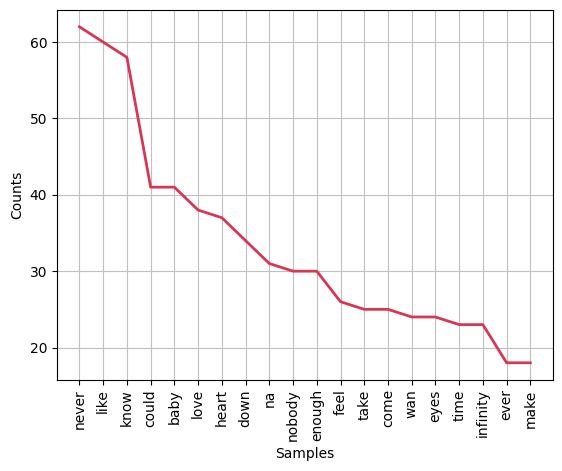

In [63]:
# Importa a classe FreqDist da biblioteca nltk, que é usada para calcular a frequência de distribuição de palavras
from nltk.probability import FreqDist

# Tokeniza o texto, dividindo-o em palavras individuais
words = word_tokenize(text)

# Cria uma distribuição de frequência das palavras no texto
fdist = FreqDist(words)

# Plota o gráfico de distribuição de frequência das 20 palavras mais comuns
# 'cumulative=False' indica que não será um gráfico acumulativo
# 'color' define a cor das barras no gráfico
fdist.plot(20, cumulative=False, color='#D93654')

# Exibe o gráfico gerado na tela
plt.show()

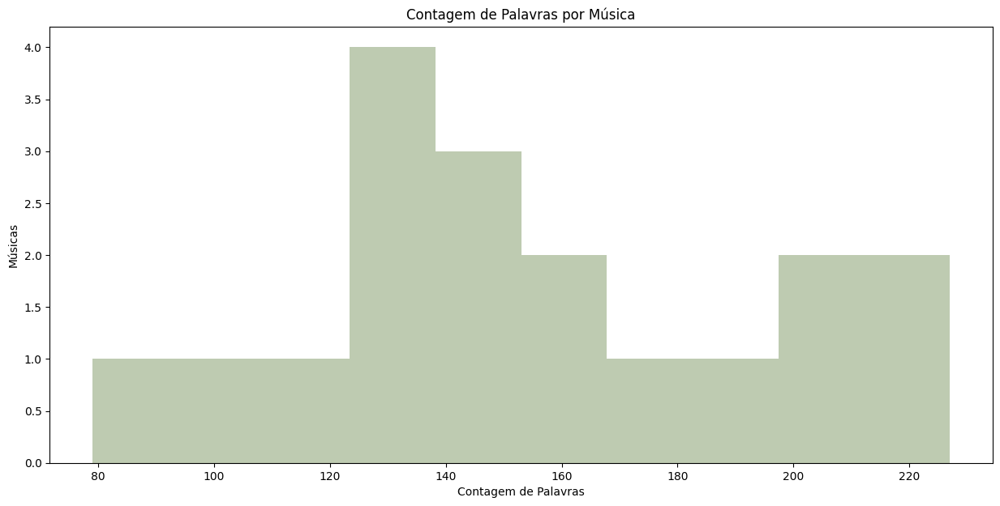

In [64]:
# Define o tamanho da figura do gráfico
plt.figure(figsize=(15, 7))

# Cria um histograma para a coluna 'Word Count' do DataFrame df_dopamine
# '10' especifica o número de bins (intervalos) no histograma
(n, bins, patches) = plt.hist(df_am['Word Count'], bins=10, color='#BECBB1')

# Adiciona rótulo ao eixo x
plt.xlabel('Contagem de Palavras')

# Adiciona rótulo ao eixo y
plt.ylabel('Músicas')

# Adiciona um título ao gráfico
plt.title('Contagem de Palavras por Música')

# Exibe o gráfico
plt.show()

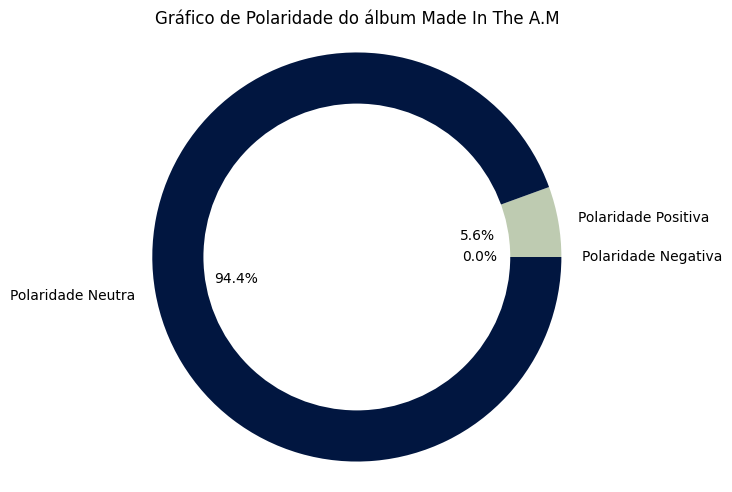

In [65]:
# Importa a classe SentimentIntensityAnalyzer do módulo nltk.sentiment
# Essa classe permite calcular a intensidade do sentimento de um texto
from nltk.sentiment import SentimentIntensityAnalyzer

# Cria uma instância do SentimentIntensityAnalyzer para analisar o sentimento
analyzer = SentimentIntensityAnalyzer()

# Analisa o sentimento de todas as letras juntas
# O método polarity_scores(text) retorna um dicionário com as pontuações de sentimento:
# 'neg' para negativo, 'neu' para neutro, 'pos' para positivo e 'compound' para uma pontuação geral
# Une o dataframe em uma string longa/TextBlob
text = " ".join(twt for twt in df_am['lyrics'])
analyzer.polarity_scores(text)

# Análise de sentimento para cada música (com sentimento neutro incluído)

# Define uma função para obter o sentimento de cada letra individualmente
def fetch_sentiment(x):
    polarity = analyzer.polarity_scores(x)
    # Decide o sentimento com base na pontuação dominante
    if polarity['neu'] > polarity['pos'] and polarity['neu'] > polarity['neg']:
        return 'neu'
    elif polarity['pos'] >= polarity['neg']:
        return 'pos'
    else:
        return 'neg'

# Aplica a função à coluna de letras
sentiment = df_am['lyrics'].apply(fetch_sentiment).value_counts()

# Garante que todas as categorias estejam presentes (mesmo que com 0)
sentiment = sentiment.reindex(['pos', 'neu', 'neg'], fill_value=0)

# Labels e cores
labels = ['Polaridade Positiva', 'Polaridade Neutra', 'Polaridade Negativa']
colors = ['#BECBB1', '#011640', '#D93654']

# Gráfico de pizza
plt.pie(sentiment, labels=labels, autopct='%1.1f%%', colors=colors)

# Círculo central (estilo donut)
cc = plt.Circle((0,0),0.75,fc='#FFFFFF')
fig = plt.gcf()
fig.gca().add_artist(cc)

# Exibição do gráfico
plt.tight_layout()
plt.title('Gráfico de Polaridade do álbum Made In The A.M')
plt.axis('equal')
plt.show()

Index(['title', 'lyrics', 'Album', 'release_year', 'Word Count', 'score',
       'sentiment', 'filter'],
      dtype='object')


<ipython-input-66-67deb217c9a9>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_four['lyrics'] = df_am['lyrics'].fillna('')  # Substitui valores nulos por string vazia


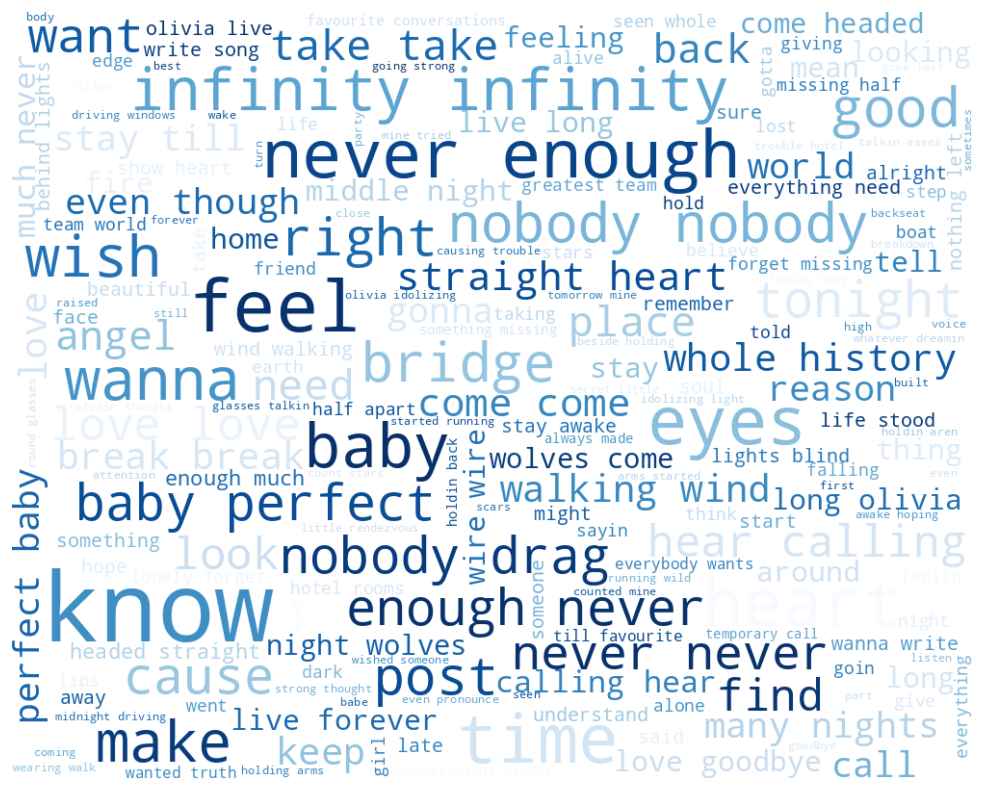

In [66]:
# Exibir os nomes das colunas do DataFrame
print(df_am.columns)

# Verifica se a coluna 'Lyrics' existe
if 'lyrics' in df_am.columns:
    # Verifica se não há valores nulos na coluna 'Lyrics'
    df_four['lyrics'] = df_am['lyrics'].fillna('')  # Substitui valores nulos por string vazia
    text = " ".join(twt for twt in df_am['lyrics'])

    # Gerando a nuvem de palavras com um tema claro
    wc = WordCloud(
        width=1000,
        height=800,
        random_state=21,
        max_font_size=100,
        relative_scaling=0.5,
        colormap="Blues",  # Alterado para um esquema de cores de fundo branco
        background_color="white"  # Define fundo branco explicitamente
    ).generate(text)

    # Exibindo a nuvem de palavras
    plt.figure(figsize=(14, 10))
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.show()
else:
    print("A coluna 'Lyrics' não foi encontrada no DataFrame.")

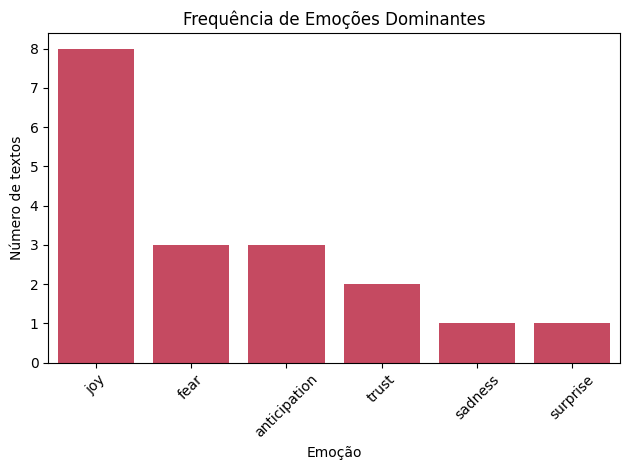

In [67]:
# Construção da barra por contagem
sns.countplot(
    x='sentiment',
    data=df_am,
    order=df_am['sentiment'].value_counts().index,
    color='#D93654'  # cor personalizada
)

#Exibição do gráfico
plt.title('Frequência de Emoções Dominantes')
plt.ylabel('Número de textos')
plt.xlabel('Emoção')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

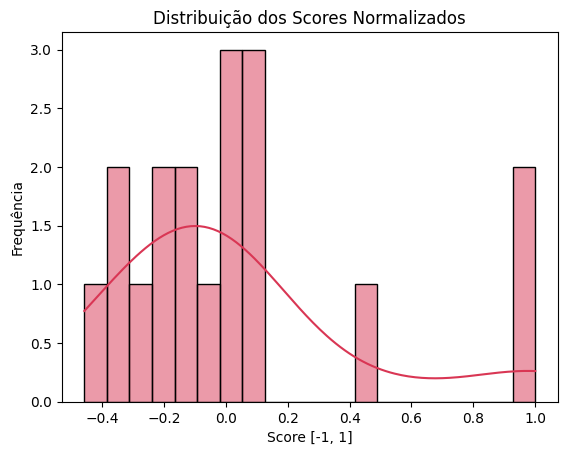

In [68]:
# Gerando o Histograma
sns.histplot(df_am['score'], bins=20, kde=True, color='#D93654')
plt.title('Distribuição dos Scores Normalizados')
plt.xlabel('Score [-1, 1]')
plt.ylabel('Frequência')
plt.show()

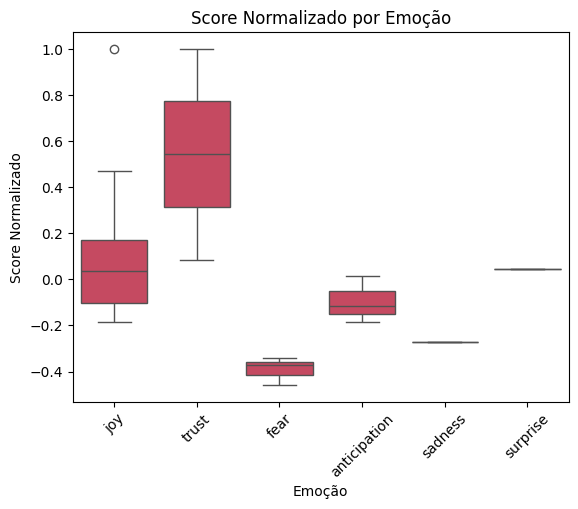

In [69]:
# Gerando o Boxplot
sns.boxplot(x='sentiment', y='score', data=df_am, color='#D93654')
plt.title('Score Normalizado por Emoção')
plt.xlabel('Emoção')
plt.ylabel('Score Normalizado')
plt.xticks(rotation=45)
plt.show()

Nenhuma letra encontrada para a emoção 'anger'.


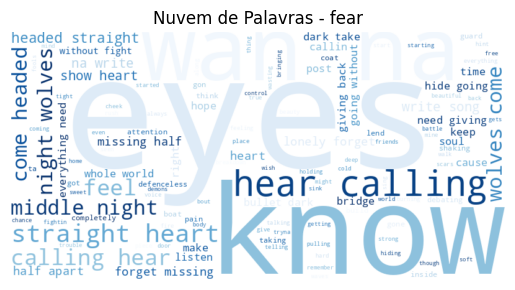

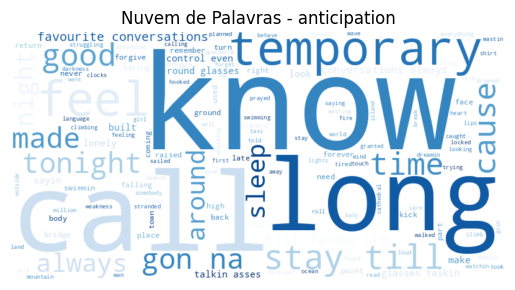

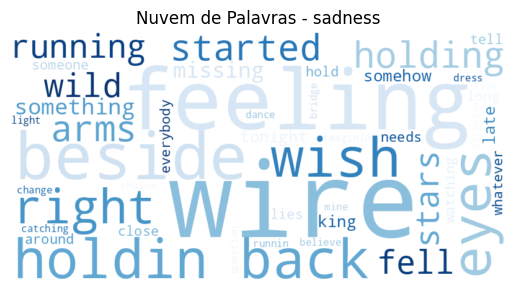

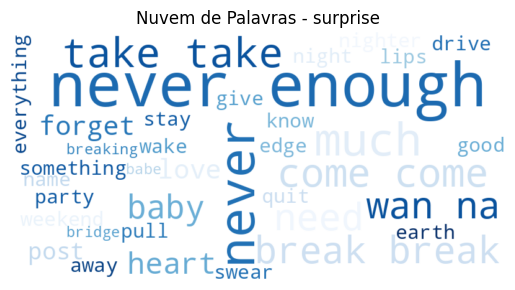

Nenhuma letra encontrada para a emoção 'disgust'.


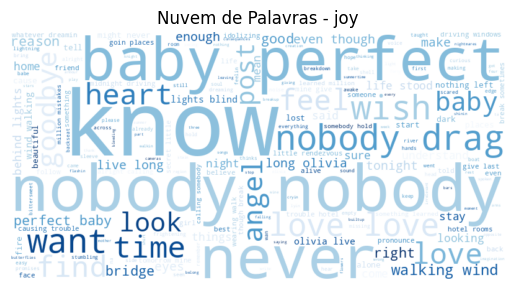

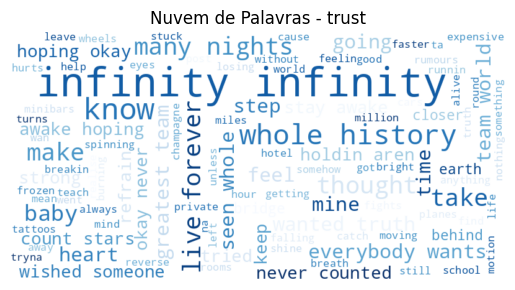

In [70]:
# Gerar a nuvem de palavras para cada emoção
for emotion in emotion_sentiments:
    words = []

    # Verificar se há letras associadas à emoção
    emotion_lyrics = df_am[df_am['sentiment'] == emotion]['lyrics']

    # Verifica se a emoção tem textos associados
    if not emotion_lyrics.empty:
        for text in emotion_lyrics:
            words.extend(word_tokenize(text.lower()))

        # Se houver palavras associadas à emoção
        if words:
            # Gerar a nuvem de palavras com fundo branco e tons de azul
            wordcloud = WordCloud(
                width=800,
                height=400,
                background_color='white',  # Fundo branco
                colormap='Blues'  # Paleta de tons de azul
            ).generate(' '.join(words))

            # Mostrar a nuvem de palavras
            plt.figure()
            plt.imshow(wordcloud, interpolation='bilinear')
            plt.axis('off')
            plt.title(f'Nuvem de Palavras - {emotion}')
            plt.show()
        else:
            print(f"Nenhuma palavra encontrada para a emoção '{emotion}'.")
    else:
        print(f"Nenhuma letra encontrada para a emoção '{emotion}'.")

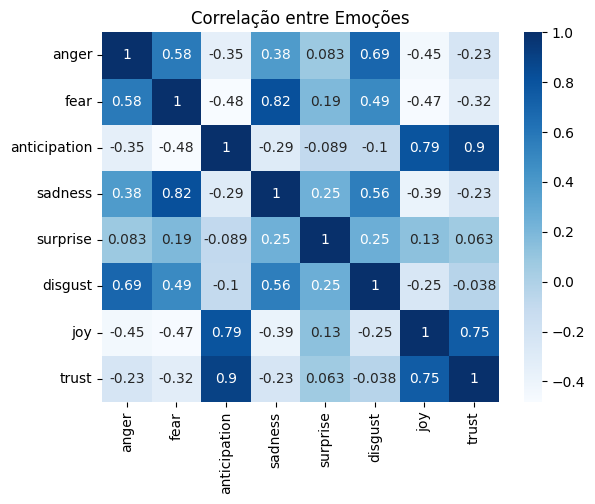

In [71]:
# Contar emoções por texto
emotion_columns = list(emotion_sentiments)
emotion_counts = []

for text in df_am['lyrics']:
    tokens = word_tokenize(text.lower())
    counts = {emotion: 0 for emotion in emotion_columns}
    for token in tokens:
        for emotion in nrc_dict.get(token, []):
            counts[emotion] += 1
    emotion_counts.append(counts)

emotion_df = pd.DataFrame(emotion_counts)

# Gerar o heatmap com tons de azul
sns.heatmap(emotion_df.corr(), annot=True, cmap="Blues")
plt.title("Correlação entre Emoções")
plt.show()